# Etude des régimes de temps


**Auteur : FERRY Frédéric (ENM/C3M) - Janvier 2022.
mailto:frederic.ferry@meteo.fr

Les régimes de temps sont des briques élémentaires de la circulation extratropicale de grande échelle spatialement bien définis, récurrents, de durée de vie de l’ordre de quelques jours à quelques semaines. **Le régime de temps est la principale entité physique des fluctuations atmosphériques aux moyennes latitudes** et les changements du temps qu'il fait peuvent se comprendre comme le passage d'un régime à un autre. La variabilité climatique peut, quant à elle, s'interpréter comme la conséquence sur une longue période de transitions privilégiées vers un régime donné. Ainsi, le concept de régime de temps fournit une grille de lecture simplificatrice du climat des latitudes moyennes et de son évolution.

**On s'intéressera ici à l'étude des régimes de temps de l'Atlantique Nord (et éventuellement du Pacifique nord) à partir de séries quotidiennes de géopotentiel à 500 hPa et de pression réduite au niveau de la mer**. 

- Etape 1 : ouverture et sélection des données quotidiennes
- Etape 2 : calcul des anomalies quotidiennes
- Etape 3 : décomposition des données en temps et en espace (analyse en composantes principales, ACP)
- Etape 4 : classification en 4 classes = régimes (méthode k-means)
- Etape 5 : obtention des régimes de temps
- Etape 6 : temps sensible associé aux régimes de temps
- Etape 7 : étude des occurrences saisonnières des régimes de temps
- Etape 8 : corrélation régimes/indices océaniques (Nino 3.4, TNA, AMV)
- Etape 9 : retour sur une saison particulière

Concepts Python illustrés :

- Exploitation de fichiers de données météorologiques au format netcdf (xarray/netCDF4)
- Calcul d'anomalies quotidiennes (méthode groupby de xarray)
- Création de séries temporelles (pandas)
- Tracé de cartes (matplotlib/cartopy)
- Régression linéaire (module LinearRegression de sklearn, https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)
- Analyse en composantes principales (package eofs, https://ajdawson.github.io/eofs/latest/)
- Représentation des données dans un espace des phases (scatterplot 2D ou 3D)
- Tracé de densité de points (module gaussian_kde de scipy)
- Classification K-means (module KMeans de sklearn, https://scikit-learn.org/stable/modules/clustering.html)
- Réalisation de cartes composites (moyenne par classe)

<div class="alert alert-warning">
<b>Instructions : </b>
<p><b>1) </b>Exécuter les cellules qui suivent de façon séquentielle</p>
<p><b>2) </b>Répondre aux questions (celulles de couleur jaune) dans les cadres réponses dédiés (cellules de couleur verte)</p>
<p><b>3) </b>Sauvegarder le calepin final au format pdf</p>
</div>

<div class="alert alert-danger">
<b>Attention : les étapes 3 (Analyse en composantes principales) et 4 (classification) ne sont pas au programme de première année et sont à utiliser ici comme des boîtes noires </b>
</div>

In [1]:
%matplotlib inline

import calendar
from calendar import isleap
import datetime
import os

import numpy as np
from scipy.stats import gaussian_kde

import IPython.display as IPdisplay, matplotlib.font_manager as fm
from PIL import Image
import glob

import xarray as xr
from netCDF4 import Dataset

import pandas as pd
from pandas import Series
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
from mpl_toolkits.axes_grid1 import AxesGrid
from mpl_toolkits.axes_grid1 import ImageGrid
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.path as mpath

from cartopy import config
import cartopy.feature as cfeature
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

from eofs.standard import Eof

from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings("ignore")

In [2]:
dir_data='./data/'
dir_res='./result/'
dir_figs='./figs/'
dir_anim='./anim/'

if not os.path.exists(dir_figs):
    os.makedirs(dir_figs)
if not os.path.exists(dir_anim):
    os.makedirs(dir_anim)
if not os.path.exists(dir_res):
    os.makedirs(dir_res)

# Etape 1 : ouverture et sélection des données quotidiennes

In [3]:
var_text=input("Z500 ou Pmer : Z500/MSLP? ")

if var_text=='Z500':
    infile = dir_data+'zg500_1d_19480101_20191231_NCEP.nc'
    varname='zg500'
    var_div=1
    units='m'

if var_text=='MSLP':
    infile = dir_data+'slp_1d_19480101_20191231_NCEP.nc'
    varname='slp'
    var_div=100
    units='hPa'

data0    = xr.open_dataset(infile)
print(data0.variables)

Z500 ou Pmer : Z500/MSLP? Z500
Frozen({'time': <xarray.IndexVariable 'time' (time: 26298)>
array(['1948-01-01T00:00:00.000000000', '1948-01-02T00:00:00.000000000',
       '1948-01-03T00:00:00.000000000', ..., '2019-12-29T00:00:00.000000000',
       '2019-12-30T00:00:00.000000000', '2019-12-31T00:00:00.000000000'],
      dtype='datetime64[ns]')
Attributes:
    standard_name:  time
    axis:           T, 'lon': <xarray.IndexVariable 'lon' (lon: 144)>
array([  0. ,   2.5,   5. ,   7.5,  10. ,  12.5,  15. ,  17.5,  20. ,  22.5,
        25. ,  27.5,  30. ,  32.5,  35. ,  37.5,  40. ,  42.5,  45. ,  47.5,
        50. ,  52.5,  55. ,  57.5,  60. ,  62.5,  65. ,  67.5,  70. ,  72.5,
        75. ,  77.5,  80. ,  82.5,  85. ,  87.5,  90. ,  92.5,  95. ,  97.5,
       100. , 102.5, 105. , 107.5, 110. , 112.5, 115. , 117.5, 120. , 122.5,
       125. , 127.5, 130. , 132.5, 135. , 137.5, 140. , 142.5, 145. , 147.5,
       150. , 152.5, 155. , 157.5, 160. , 162.5, 165. , 167.5, 170. , 172.5,
       1

In [4]:
domain_name=input("Domaine Atlantique nord ou Pacifique : natl/npac ? ")

if domain_name=='natl':
    domain='North Atlantic'
    latS=20
    latN=80
    lonW=-80
    lonE=30
if domain_name=='npac':
    domain='North Pacific'
    latS=20
    latN=80
    lonW=115
    lonE=285

Domaine Atlantique nord ou Pacifique : natl/npac ? natl


In [5]:
season_name=input("Saison hiver ou été : winter/summer ? ")

if season_name=='winter':
    season='Winter'
    startday  = '1957-12-01'
    endday  = '2018-03-31'
if season_name=='summer':
    season='Summer'
    startday  = '1958-06-01'
    endday  = '2018-09-30'

# Date index from startday to endday
dates = pd.date_range(startday, endday, freq='D')
print(dates)

# Remove 29/02
#def is_leap_and_29Feb(s):
#    return (s.year % 4 == 0) & ((s.year % 100 != 0) | (s.year % 400 == 0)) & (s.month == 2) & (s.day == 29)
#mask = is_leap_and_29Feb(dates)
#dates=dates[~mask]
#print(dates)

# Select Season
if season_name == 'winter':
    months=np.any([dates.month==12,dates.month==1,dates.month==2,dates.month==3],axis=0)
if season_name == 'summer':
    months=np.any([dates.month==6,dates.month==7,dates.month==8,dates.month==9],axis=0)

dates2=dates[months]
print(dates2)

Saison hiver ou été : winter/summer ? winter
DatetimeIndex(['1957-12-01', '1957-12-02', '1957-12-03', '1957-12-04',
               '1957-12-05', '1957-12-06', '1957-12-07', '1957-12-08',
               '1957-12-09', '1957-12-10',
               ...
               '2018-03-22', '2018-03-23', '2018-03-24', '2018-03-25',
               '2018-03-26', '2018-03-27', '2018-03-28', '2018-03-29',
               '2018-03-30', '2018-03-31'],
              dtype='datetime64[ns]', length=22036, freq='D')
DatetimeIndex(['1957-12-01', '1957-12-02', '1957-12-03', '1957-12-04',
               '1957-12-05', '1957-12-06', '1957-12-07', '1957-12-08',
               '1957-12-09', '1957-12-10',
               ...
               '2018-03-22', '2018-03-23', '2018-03-24', '2018-03-25',
               '2018-03-26', '2018-03-27', '2018-03-28', '2018-03-29',
               '2018-03-30', '2018-03-31'],
              dtype='datetime64[ns]', length=7396, freq=None)


In [6]:
def lonflip(da):
    lon_name = 'lon'
    da['_longitude_adjusted'] = xr.where(
        da[lon_name] > 180,
        da[lon_name] - 360,
        da[lon_name])
    da = (
        da
        .swap_dims({lon_name: '_longitude_adjusted'})
        .sel(**{'_longitude_adjusted': sorted(da._longitude_adjusted)})
        .drop(lon_name))
    da = da.rename({'_longitude_adjusted': lon_name})
    return da

In [7]:
if domain_name=='natl':
    data = lonflip(data0)
if domain_name=='npac':
    data = data0

data_season = data.sel(lat=slice(latN,latS)).sel(lon=slice(lonW,lonE)).sel(time=dates2)
print(data_season)

lat  = data_season.lat.values
lon  = data_season.lon.values
time  = data_season.time.values

if season_name == 'winter':
    season1= str(data_season.time.values[130])[0:4]
    season2= str(data_season.time.values[-1])[0:4]

if season_name == 'summer':
    season1= str(data_season.time.values[0])[0:4]
    season2= str(data_season.time.values[-1])[0:4]

print(' ----- Saving new seasonnal file from '+startday+ ' to '+endday+ ' on new domain  ----- ')
infile1 = dir_res+varname+'_'+startday+'_'+endday+'_'+domain_name+'.nc'
data_season.to_netcdf(infile1)
print(' new daily seasonnal file over subdomain is here : ')
print(infile1)

<xarray.Dataset>
Dimensions:  (time: 7396, lat: 25, lon: 45)
Coordinates:
  * time     (time) datetime64[ns] 1957-12-01 1957-12-02 ... 2018-03-31
  * lat      (lat) float32 80.0 77.5 75.0 72.5 70.0 ... 30.0 27.5 25.0 22.5 20.0
  * lon      (lon) float32 -80.0 -77.5 -75.0 -72.5 -70.0 ... 22.5 25.0 27.5 30.0
Data variables:
    zg500    (time, lat, lon) float32 ...
Attributes:
    CDI:                       Climate Data Interface version 1.9.9 (https://...
    Conventions:               COARDS
    history:                   Mon Dec 21 17:43:31 2020: cdo mergetime zg500_...
    title:                     mean daily NMC reanalysis (2013)
    description:               Data is from NMC initialized reanalysis\n(4x/d...
    platform:                  Model
    references:                http://www.esrl.noaa.gov/psd/data/gridded/data...
    nco_openmp_thread_number:  1
    CDO:                       Climate Data Operators version 1.9.9 (https://...
 ----- Saving new seasonnal file from 1957-12

In [ ]:
with np.printoptions(threshold=np.inf):
    print(time)

# Etape 2 : calcul des anomalies quotidiennes

In [9]:
print(' ----- Computing daily anomalies ----- ')
data_anom = data_season.groupby('time.dayofyear') - data_season.groupby('time.dayofyear').mean('time')
print(data_anom)
print(' ----- Writing netcdf ----- ')
infile2 = dir_res+varname+'_anom_'+startday+'_'+endday+'_'+domain_name+'.nc'
data_anom.to_netcdf(infile2)
print(' netcdf file of daily anomalies is here : ')
print(infile2)

 ----- Computing daily anomalies ----- 
<xarray.Dataset>
Dimensions:    (time: 7396, lat: 25, lon: 45)
Coordinates:
  * time       (time) datetime64[ns] 1957-12-01 1957-12-02 ... 2018-03-31
  * lat        (lat) float32 80.0 77.5 75.0 72.5 70.0 ... 27.5 25.0 22.5 20.0
  * lon        (lon) float32 -80.0 -77.5 -75.0 -72.5 ... 22.5 25.0 27.5 30.0
    dayofyear  (time) int64 335 336 337 338 339 340 341 ... 84 85 86 87 88 89 90
Data variables:
    zg500      (time, lat, lon) float32 -24.59 -24.55 -24.99 ... 27.29 16.73
 ----- Writing netcdf ----- 
 netcdf file of daily anomalies is here : 
./result/zg500_anom_1957-12-01_2018-03-31_natl.nc


In [10]:
if season_name == 'winter':
    #date1='19891201'
    #date2='19891230'
    #date1='19900101'
    #date2='19900130'
    #date1='20100201'
    #date2='20100302'
    date1='20111201'
    date2='20111230'
    
if season_name == 'summer':
    date1='20030801'
    date2='20030830'
    
data_month    = data_season.sel(time=slice(date1,date2))
data_month_anom    = data_anom.sel(time=slice(date1,date2))

z=data_month[varname]/var_div
z_anom=data_month_anom[varname]/var_div

time  = data_month.time.values

time_str=[x for x in range(len(time))]
date_str=[x for x in range(len(time))]

for i in range(len(time)):
	time_str[i] = str(time[i])
	date_str[i] = time_str[i][0:10]
    
print(data_month)

<xarray.Dataset>
Dimensions:  (time: 30, lat: 25, lon: 45)
Coordinates:
  * time     (time) datetime64[ns] 2011-12-01 2011-12-02 ... 2011-12-30
  * lat      (lat) float32 80.0 77.5 75.0 72.5 70.0 ... 30.0 27.5 25.0 22.5 20.0
  * lon      (lon) float32 -80.0 -77.5 -75.0 -72.5 -70.0 ... 22.5 25.0 27.5 30.0
Data variables:
    zg500    (time, lat, lon) float32 5.033e+03 5.029e+03 ... 5.877e+03
Attributes:
    CDI:                       Climate Data Interface version 1.9.9 (https://...
    Conventions:               COARDS
    history:                   Mon Dec 21 17:43:31 2020: cdo mergetime zg500_...
    title:                     mean daily NMC reanalysis (2013)
    description:               Data is from NMC initialized reanalysis\n(4x/d...
    platform:                  Model
    references:                http://www.esrl.noaa.gov/psd/data/gridded/data...
    nco_openmp_thread_number:  1
    CDO:                       Climate Data Operators version 1.9.9 (https://...


In [11]:
projection = ccrs.Orthographic(central_longitude=(lonW+lonE)/2, central_latitude=(latS+latN)/2)

def make_boundary_path(lon,lat):
    lons,lats=np.meshgrid(lon,lat)
    boundary_path = np.array([lons[-1,:],lats[-1,:]])
    boundary_path = np.append(boundary_path,np.array([lons[::-1,-1],lats[::-1,-1]]),axis=1)
    boundary_path = np.append(boundary_path,np.array([lons[1,::-1],lats[1,::-1]]),axis=1)
    boundary_path = np.append(boundary_path,np.array([lons[:,1],lats[:,1]]),axis=1)
    boundary_path = mpath.Path(np.swapaxes(boundary_path, 0, 1))
    return boundary_path

In [12]:
if varname=='zg500':
    levels1 = np.arange(4800,6200,100)
    plt_title1 = 'Geopotential height ('+units+') at 500 hPa : '+ str(date1)+'-'+str(date2)
    levels2 = np.arange(-500,550,50)
    plt_title2 = 'Geopotential height anomaly ('+units+') at 500 hPa : '+ str(date1)+'-'+str(date2)

if varname=='slp':
    levels1 = np.arange(980,1040,5)
    plt_title1 = 'Mean Sea Level Pressure ('+units+') : '+ str(date1)+'-'+str(date2)
    levels2 = np.arange(-25,27.5,2.5)
    plt_title2 = 'Mean Sea Level Pressure anomaly ('+units+') : '+ str(date1)+'-'+str(date2)

cmap1='jet'
cmap2='RdBu_r'

In [13]:
for i in range(len(time)):
    #print(date_str[i])
    fig = plt.figure(figsize=(8., 8.))
    fig.suptitle(plt_title2, fontsize=16)
    ax = fig.add_subplot(1,1,1, projection=projection)
    ax.set_title(date_str[i], loc='center')
    ax.coastlines()
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    p1 = ax.contourf(lon, lat, z_anom[i,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    p3 = ax.contour(lon, lat, z[i,:,:], levels1, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    ax.clabel(p3, inline=1, fmt='%4.0f', fontsize=10)
    cb = fig.colorbar(p1, orientation='horizontal', aspect=65, shrink=0.5, pad=0.05, extendrect='True')
    cb.set_label('Anomaly ('+units+')', fontsize=12)

    figname=dir_anim+varname+'_anom_'+domain_name+'_'+season_name+'_'+date_str[i]
    fig.savefig(figname+'.png', bbox_inches='tight')
    plt.close()
print('png files are in the animation folder, ready to make the animation')

png files are in the animation folder, ready to make the animation


In [14]:
def make_animation():
    nbimages=len(time)
    # create a tuple of display durations, one for each frame
    first_last = 1000 #show the first and last frames for 1000 ms
    standard_duration = 1000 #show all other frames for 1000 ms
    durations = tuple([first_last] + [standard_duration] * (nbimages - 2) + [first_last])
    # load all the static images into a list
    images = [Image.open(image) for image in sorted(glob.glob('{}/*.png'.format(dir_anim)))]
    # save as an animated gif
    gif = images[0]
    gif.info['duration'] = durations #ms per frame
    gif.info['loop'] = 0 #how many times to loop (0=infinite)
    gif.save(fp=gif_filepath, format='gif', save_all=True, append_images=images[1:])
    # verify that the number of frames in the gif equals the number of image files and durations
    Image.open(gif_filepath).n_frames == len(images) == len(durations)
    # clean png
    os.chdir(dir_anim)
    for f in glob.glob("*.png"):
        os.remove(f)
    os.chdir("../")
    return Image

In [15]:
gif_filepath = dir_anim+varname+'_anom_'+domain_name+'_'+season_name+'_'+str(date1)+'-'+str(date2)+'.gif'
make_animation()
IPdisplay.Image(url=gif_filepath)

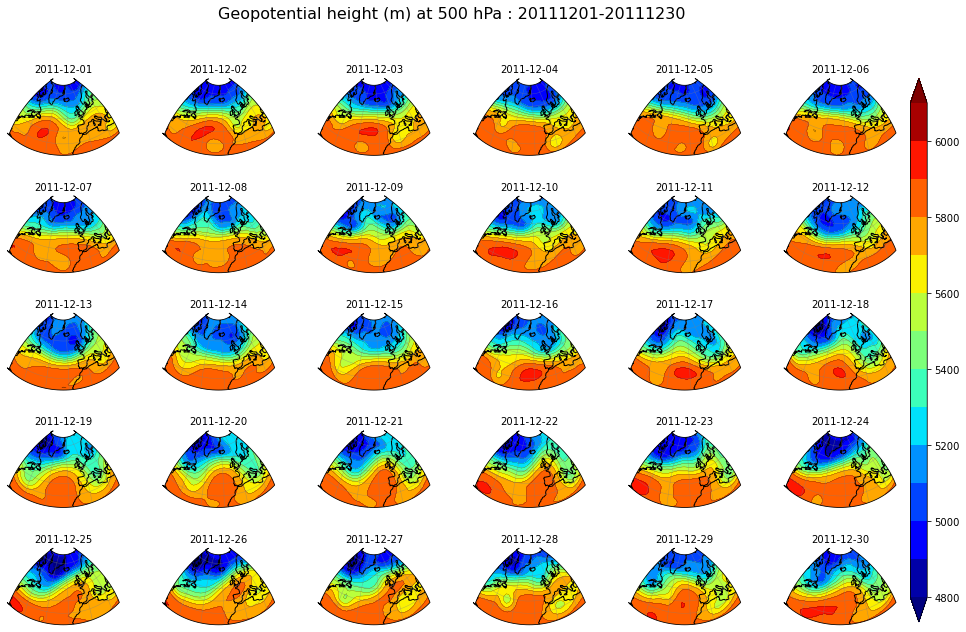

In [16]:
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title1, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.coastlines()
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.set_title(date_str[i], fontsize=10)
    p1 = ax.contourf(lon, lat, z[i,:,:], levels1, transform=ccrs.PlateCarree(), cmap=cmap1, extend='both')
    p2 = ax.contour(lon, lat, z[i,:,:], levels1, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_'+str(date1)+'-'+str(date2)
fig.savefig(figname+'.png', bbox_inches='tight')

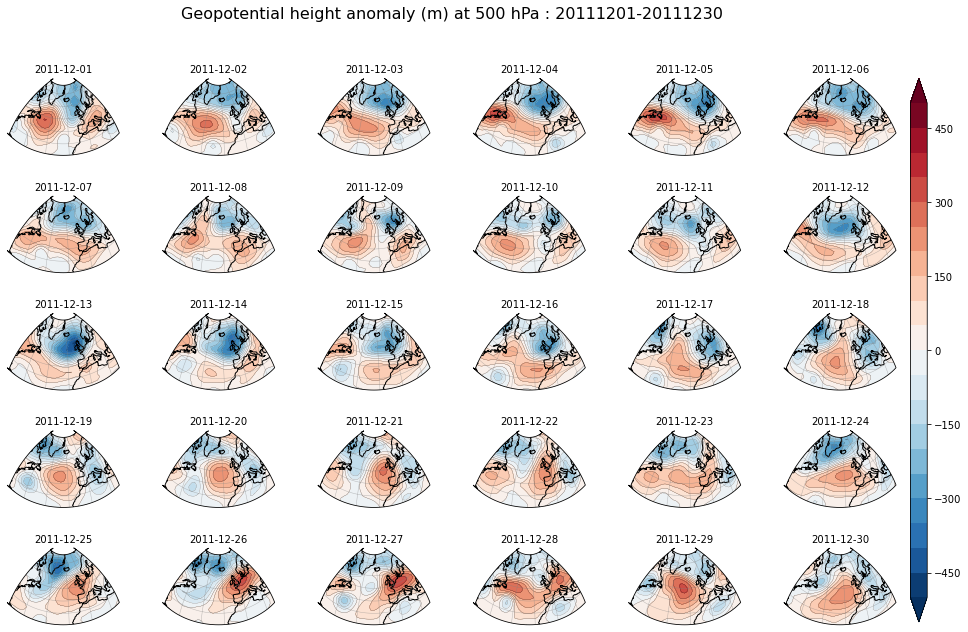

In [17]:
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    ax.coastlines()
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.set_title(date_str[i], fontsize=10)
    p1 = ax.contourf(lon, lat, z_anom[i,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_'+str(date1)+'-'+str(date2)
fig.savefig(figname+'.png', bbox_inches='tight')

<div class="alert alert-warning">
<b>Question : </b>
<p><b>1) </b>Pour la séquence mensuelle choisie, peut-on déjà regrouper subjectivement des jours qui se ressemblent ? Combien de groupes pourrait-on faire ?</p>
</div>

<div class="alert alert-success">
<b>Réponse : </b>
<p>
</p>
</div>

# Etape 3 : décomposition des données en temps et en espace (analyse en composantes principales, ACP)

<div class="alert alert-danger">
<b>Exécuter l'ensemble des cellules de l'étape 3 ci-dessous</b>
</div>

In [18]:
filename = infile1
ncin = Dataset(filename, 'r')
lons = ncin.variables['lon'][:]
lats = ncin.variables['lat'][:]
var = ncin.variables[varname][:]/var_div
ncin.close()

filename = infile2
ncin = Dataset(filename, 'r')
lons = ncin.variables['lon'][:]
lats = ncin.variables['lat'][:]
var_anom = ncin.variables[varname][:]/var_div
ncin.close()

In [19]:
wgts = np.sqrt(np.cos(np.deg2rad(lats)))[:, np.newaxis]
solver = Eof(var_anom, weights=wgts, center=True)

In [20]:
n=15
eofs = solver.eofs(neofs=n, eofscaling=1)
pcs = solver.pcs(npcs=n, pcscaling=0)
#pcs_norm = solver.pcs(npcs=n, pcscaling=1)
varfrac = solver.varianceFraction()
print("% de variance expliquée par les 10 premiers EOFs : ", 100*varfrac[0:10].sum())

% de variance expliquée par les 10 premiers EOFs :  82.63503909111023


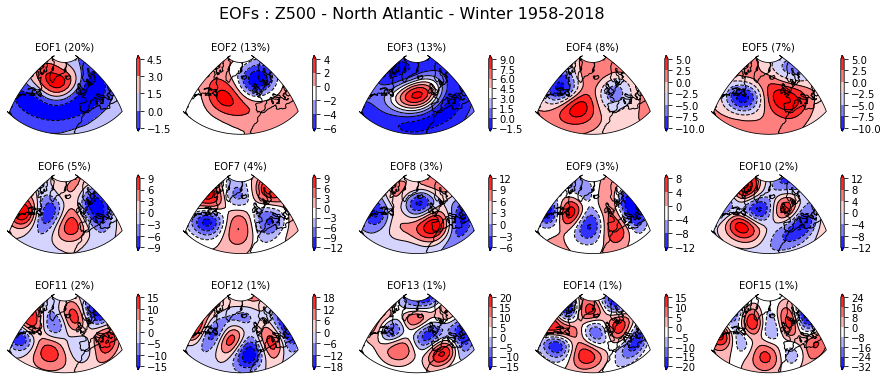

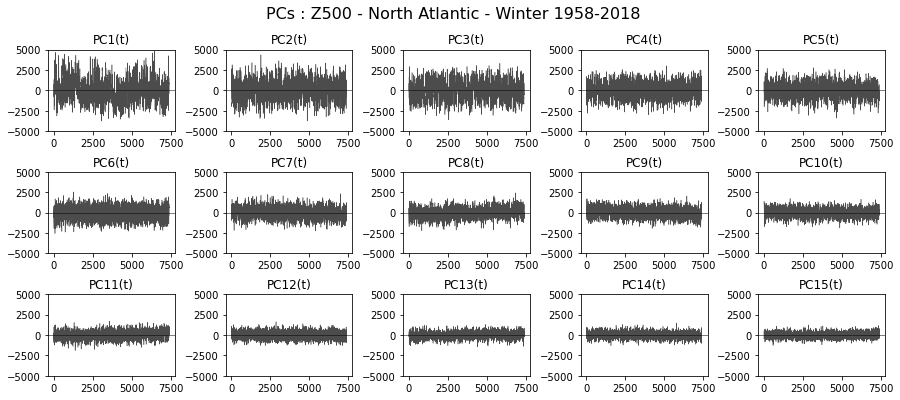

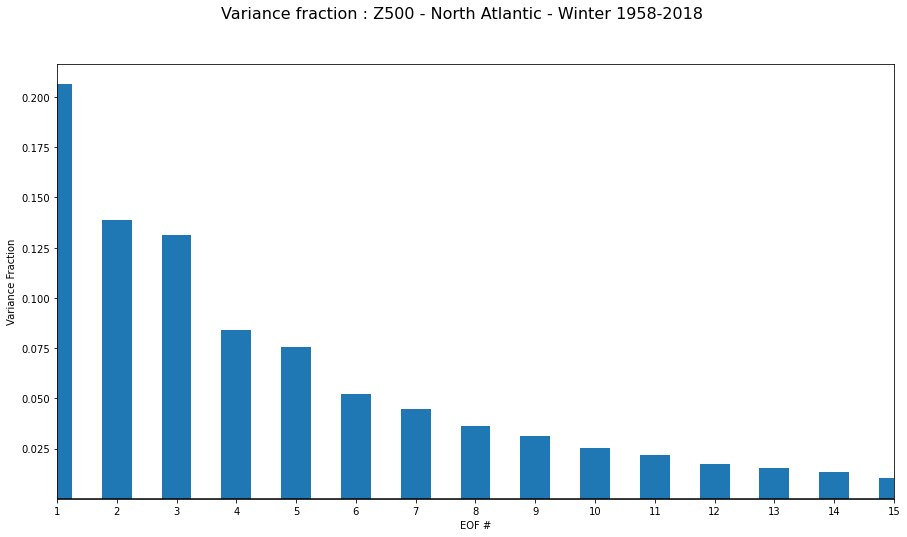

In [21]:
axes_class = (GeoAxes, dict(map_projection=projection))

fig = plt.figure(figsize=(15,6))
fig.suptitle('EOFs : '+var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(3, 5),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='each', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.set_title('EOF'+str(i+1)+' ('+str(int(varfrac[i]*100))+'%)', fontsize=10, loc='center')
    cf = ax.contourf(lons, lats, eofs[i]*1e5, transform=ccrs.PlateCarree(), cmap='bwr', extend='both')
    c = ax.contour(lons, lats, eofs[i]*1e5, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(cf)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_eofs'
fig.savefig(figname+'.png', bbox_inches='tight')

fig = plt.figure(figsize=(15,6))
fig.suptitle('PCs : '+var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)

plt.subplots_adjust(hspace=0.5, wspace=0.4)

for i in range(0, 15):
        plt.subplot(3, 5, i+1)
        plt.title('PC'+str(i+1)+'(t)')
        plt.axhline(0, color='k', linewidth=0.5)
        if varname=='zg500':
            plt.ylim(-5000, 5000)
        if varname=='slp':
            plt.ylim(-200, 200)
        plt.plot(pcs[:,i], color='k', linewidth=0.5, alpha=0.7)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pcs'
fig.savefig(figname+'.png', bbox_inches='tight')
             
fig = plt.figure(figsize=(15, 8))
fig.suptitle('Variance fraction : '+var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)

eof_num = range(1, 16)
plt.bar(eof_num, varfrac[0:15], width=0.5)
plt.axhline(0, color='k')
plt.xticks(range(1, 16))
plt.xlabel('EOF #')
plt.ylabel('Variance Fraction')
plt.xlim(1, 15)
plt.ylim(np.min(varfrac), np.max(varfrac)+0.01)
plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_varfrac'
fig.savefig(figname+'.png', bbox_inches='tight')

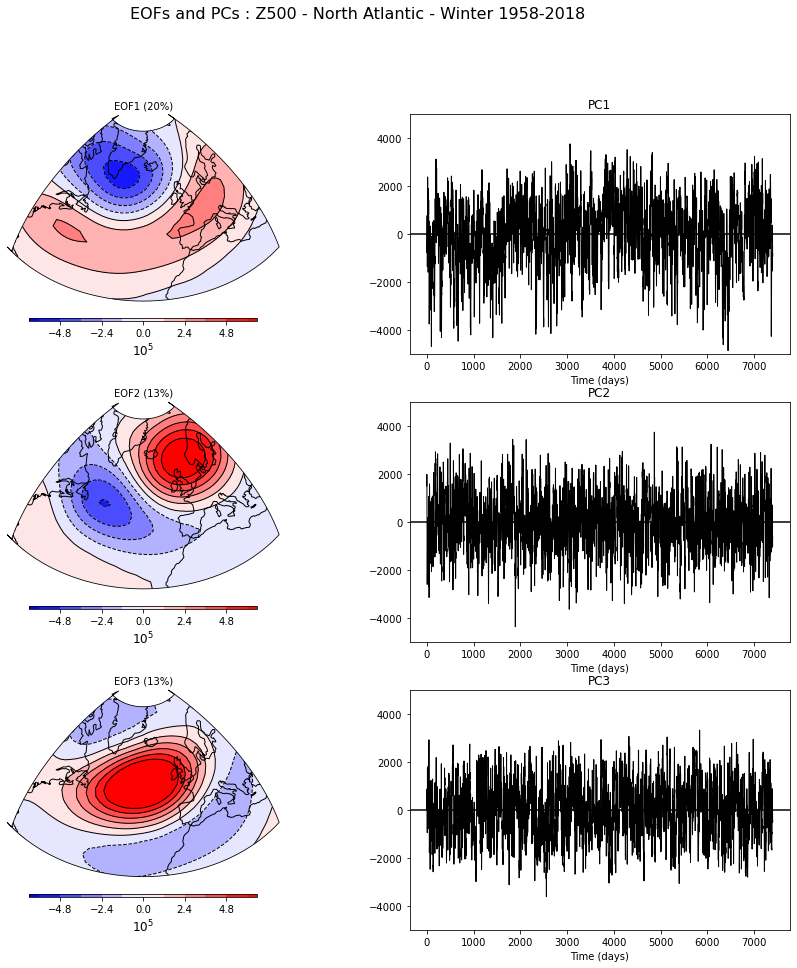

In [22]:
eof1=eofs[0]*(-1)
eof2=eofs[1]*(-1)
eof3=eofs[2]

pc1=pcs[:,0]*(-1)
pc2=pcs[:,1]*(-1)
pc3=pcs[:,2]

def plot_pc(ax):
    plt.xlabel('Time (days)')
    plt.axhline(0, color='k')
    if varname=='zg500':
        ax.set_ylim(-5000, 5000)
    if varname=='slp':
        ax.set_ylim(-200, 200)
    return ax

if varname=='zg500':
    clevs = np.linspace(-6, 6, 11)
if varname=='slp':
    clevs = np.linspace(-5, 5, 11)

fig = plt.figure(figsize=(15, 15))

fig.suptitle('EOFs and PCs : '+var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)
ax = fig.add_subplot(3, 2, 1, projection=projection)
plt.title('EOF1 ('+str(int(varfrac[0]*100))+'%)', fontsize=10, loc='center')
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon, lat)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, eof1*1e5, clevs, cmap='bwr', extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, eof1*1e5, clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
cb = fig.colorbar(cf, orientation='horizontal', aspect=70, shrink=0.6, pad=0.1, extendrect='True')
cb.set_label('$10^{5}$', fontsize=12)

ax = fig.add_subplot(3, 2, 2)
plot_pc(ax)
plt.title('PC1')
plt.plot(pc1, color='k', linewidth=1)

ax = fig.add_subplot(3, 2, 3, projection=projection)
plt.title('EOF2 ('+str(int(varfrac[1]*100))+'%)', fontsize=10, loc='center')
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon, lat)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, eof2*1e5, clevs, cmap='bwr', extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, eof2*1e5, clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
cb = fig.colorbar(cf, orientation='horizontal', aspect=70, shrink=0.6, pad=0.1, extendrect='True')
cb.set_label('$10^{5}$', fontsize=12)

ax = fig.add_subplot(3, 2, 4)
plot_pc(ax)
plt.title('PC2')
plt.plot(pc2, color='k', linewidth=1)

ax = fig.add_subplot(3, 2, 5, projection=projection)
plt.title('EOF3 ('+str(int(varfrac[2]*100))+'%)', fontsize=10, loc='center')
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon, lat)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, eof3*1e5, clevs, cmap='bwr', extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, eof3*1e5, clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
cb = fig.colorbar(cf, orientation='horizontal', aspect=70, shrink=0.6, pad=0.1, extendrect='True')
cb.set_label('$10^{5}$', fontsize=12)

ax = fig.add_subplot(3, 2, 6)
plot_pc(ax)
plt.title('PC3')
plt.plot(pc3, color='k', linewidth=1)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_eofs_pcs'
fig.savefig(figname+'.png', bbox_inches='tight')

Entrer un numéro de jour pour la reconstruction du champ : 123


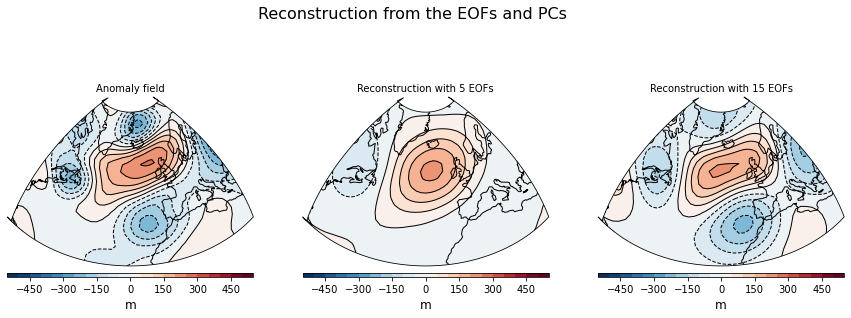

In [23]:
day=int(input("Entrer un numéro de jour pour la reconstruction du champ : "))
field=var_anom[day]

#5 EOFS
reconst=eofs[0]*pcs[day,0]*np.std(
    pcs[:,0])+eofs[1]*pcs[day,1]*np.std(
    pcs[:,1])+eofs[2]*pcs[day,2]*np.std(
    pcs[:,2])+eofs[3]*pcs[day,3]*np.std(
    pcs[:,3])+eofs[4]*pcs[day,4]*np.std(
    pcs[:,4])

reconst=reconst/wgts

#15 EOFS
reconst2=eofs[0]*pcs[day,0]*np.std(
    pcs[:,0])+eofs[1]*pcs[day,1]*np.std(
    pcs[:,1])+eofs[2]*pcs[day,2]*np.std(
    pcs[:,2])+eofs[3]*pcs[day,3]*np.std(
    pcs[:,3])+eofs[4]*pcs[day,4]*np.std(
    pcs[:,4])+eofs[5]*pcs[day,5]*np.std(    
    pcs[:,5])+eofs[6]*pcs[day,6]*np.std(    
    pcs[:,6])+eofs[7]*pcs[day,7]*np.std(
    pcs[:,7])+eofs[8]*pcs[day,8]*np.std(
    pcs[:,8])+eofs[9]*pcs[day,9]*np.std(
    pcs[:,9])+eofs[10]*pcs[day,10]*np.std(
    pcs[:,10])+eofs[11]*pcs[day,11]*np.std(
    pcs[:,11])+eofs[12]*pcs[day,12]*np.std(
    pcs[:,12])+eofs[13]*pcs[day,13]*np.std(
    pcs[:,13])+eofs[14]*pcs[day,14]*np.std(
    pcs[:,14])

reconst2=reconst2/wgts

fig = plt.figure(figsize=(15, 5))

fig.suptitle('Reconstruction from the EOFs and PCs', fontsize=16)
ax = fig.add_subplot(131, projection=projection)
plt.title('Anomaly field', fontsize=10, loc='center')
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon, lat)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, field, levels2, cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, field, levels2, colors='black', linewidths=1, transform=ccrs.PlateCarree())
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label(units, fontsize=12)

ax = fig.add_subplot(132, projection=projection)
plt.title('Reconstruction with 5 EOFs', fontsize=10, loc='center')
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon, lat)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, reconst, levels2, cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, reconst, levels2, colors='black', linewidths=1, transform=ccrs.PlateCarree())
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label(units, fontsize=12)

ax = fig.add_subplot(133, projection=projection)
plt.title('Reconstruction with 15 EOFs', fontsize=10, loc='center')
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon, lat)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, reconst2, levels2, cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, reconst2, levels2, colors='black', linewidths=1, transform=ccrs.PlateCarree())
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label(units, fontsize=12)

plt.show()

In [24]:
def plot_phase_space2d(ax):
    plt.title('')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    if varname=='zg500':
        plt.xlim(-5000, 5000)
        plt.ylim(-5000, 5000)
    if varname=='slp':
        plt.xlim(-200, 200)
        plt.ylim(-200, 200)
    plt.axvline(0, color='k', linestyle='--')
    plt.axhline(0, color='k', linestyle='--')
    return ax

def plot_phase_space3d(ax):
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    return ax

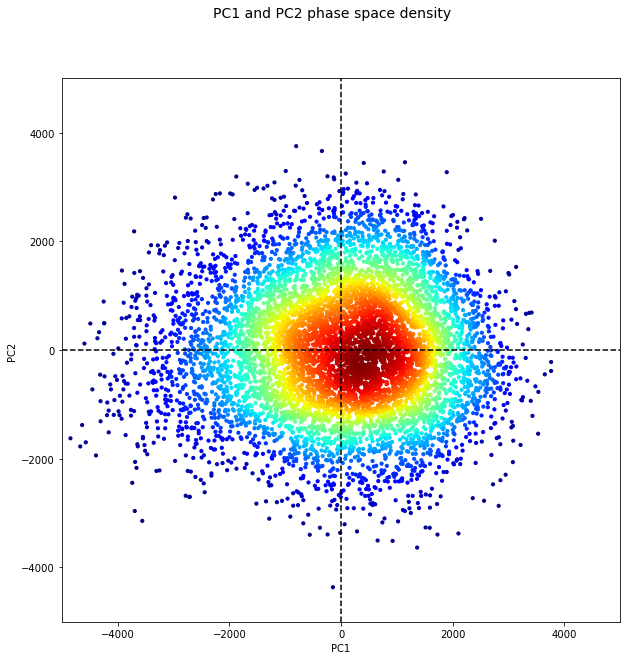

In [25]:
fig, ax = plt.subplots(figsize=(10, 10))
fig.suptitle('PC1 and PC2 phase space density', fontsize=14)
plot_phase_space2d(ax)
xy = np.vstack([pc1,pc2])
z = gaussian_kde(xy)(xy)
#ax.scatter(pc1,pc2, s=10, color = 'r')
ax.scatter(pc1, pc2, cmap='jet', c=z, s=10)
plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pc12_density'
fig.savefig(figname+'.png', bbox_inches='tight')

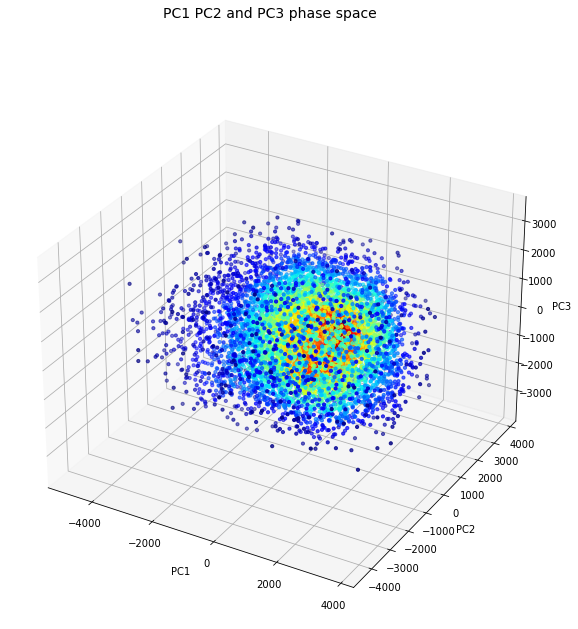

In [26]:
fig = plt.figure(figsize=(10, 10))
fig.suptitle('PC1 PC2 and PC3 phase space', fontsize=14)
ax = fig.add_subplot(111, projection='3d')
plot_phase_space3d(ax)
xyz = np.vstack([pc1,pc2,pc3])
z = gaussian_kde(xyz)(xyz)
#ax.scatter(pc1,pc2,pc3, s=10, color = 'r')
ax.scatter(pc1, pc2, pc3, cmap='jet', c=z, s=10)
plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pc123_density'
fig.savefig(figname+'.png', bbox_inches='tight')

# Etape 4 : classification en 4 classes = régimes (méthode k-means)

<div class="alert alert-danger">
<b>Exécuter l'ensemble des cellules de l'étape 4 ci-dessous</b>
</div>

Pour une illustration de l'implémentation de la méthode k-means en Python, consulter le lien suivant : https://mubaris.com/posts/kmeans-clustering/

In [27]:
pcs = np.array([pc1,pc2,pc3,pcs[:,3],
                pcs[:,4],pcs[:,5],pcs[:,6],
                pcs[:,7],pcs[:,8],pcs[:,9],
                pcs[:,10],pcs[:,11],pcs[:,12],
                pcs[:,13],pcs[:,14]],)
pcs=pcs.transpose()

#Number of time the k-means algorithm will be run with different centroid seeds
n_init=100
#Maximum number of iterations of the k-means algorithm for a single run
max_iter=500

# Number of clusters
kmeans = KMeans(n_clusters=4, n_init=n_init, max_iter=max_iter, algorithm="full", verbose=1)
# Fitting the input data
kmeans = kmeans.fit(pcs)
# Getting the cluster labels
cluster = kmeans.predict(pcs)
# Centroid values
centroids = kmeans.cluster_centers_

print(cluster)
print(cluster.shape)
print(centroids.shape)

Initialization complete
Iteration 0, inertia 69502312448.0.
Iteration 1, inertia 49336295424.0.
Iteration 2, inertia 48602120192.0.
Iteration 3, inertia 48265175040.0.
Iteration 4, inertia 47877419008.0.
Iteration 5, inertia 47438934016.0.
Iteration 6, inertia 47034748928.0.
Iteration 7, inertia 46773493760.0.
Iteration 8, inertia 46637318144.0.
Iteration 9, inertia 46576115712.0.
Iteration 10, inertia 46541422592.0.
Iteration 11, inertia 46524039168.0.
Iteration 12, inertia 46517428224.0.
Iteration 13, inertia 46515015680.0.
Iteration 14, inertia 46513225728.0.
Iteration 15, inertia 46512218112.0.
Iteration 16, inertia 46511230976.0.
Iteration 17, inertia 46510366720.0.
Iteration 18, inertia 46509838336.0.
Iteration 19, inertia 46509252608.0.
Iteration 20, inertia 46508863488.0.
Iteration 21, inertia 46508380160.0.
Iteration 22, inertia 46507798528.0.
Iteration 23, inertia 46507515904.0.
Iteration 24, inertia 46507409408.0.
Converged at iteration 24: center shift 3.5216760635375977 wi

Iteration 15, inertia 46744969216.0.
Iteration 16, inertia 46700044288.0.
Iteration 17, inertia 46669082624.0.
Iteration 18, inertia 46646235136.0.
Iteration 19, inertia 46631673856.0.
Iteration 20, inertia 46617767936.0.
Iteration 21, inertia 46603862016.0.
Iteration 22, inertia 46590836736.0.
Iteration 23, inertia 46578839552.0.
Iteration 24, inertia 46568566784.0.
Iteration 25, inertia 46560002048.0.
Iteration 26, inertia 46548172800.0.
Iteration 27, inertia 46537416704.0.
Iteration 28, inertia 46529716224.0.
Iteration 29, inertia 46524653568.0.
Iteration 30, inertia 46520557568.0.
Iteration 31, inertia 46517784576.0.
Iteration 32, inertia 46516047872.0.
Iteration 33, inertia 46514520064.0.
Iteration 34, inertia 46513848320.0.
Iteration 35, inertia 46513123328.0.
Iteration 36, inertia 46512357376.0.
Iteration 37, inertia 46511431680.0.
Iteration 38, inertia 46510841856.0.
Iteration 39, inertia 46510141440.0.
Iteration 40, inertia 46508703744.0.
Iteration 41, inertia 46508032000.0.
I

Iteration 35, inertia 46550126592.0.
Iteration 36, inertia 46544289792.0.
Iteration 37, inertia 46539259904.0.
Iteration 38, inertia 46532853760.0.
Iteration 39, inertia 46529007616.0.
Iteration 40, inertia 46526152704.0.
Iteration 41, inertia 46522875904.0.
Iteration 42, inertia 46520594432.0.
Iteration 43, inertia 46518378496.0.
Iteration 44, inertia 46517215232.0.
Iteration 45, inertia 46516314112.0.
Iteration 46, inertia 46515044352.0.
Iteration 47, inertia 46514147328.0.
Iteration 48, inertia 46513717248.0.
Iteration 49, inertia 46513205248.0.
Iteration 50, inertia 46512627712.0.
Iteration 51, inertia 46511579136.0.
Iteration 52, inertia 46510989312.0.
Iteration 53, inertia 46510551040.0.
Iteration 54, inertia 46510112768.0.
Iteration 55, inertia 46509654016.0.
Iteration 56, inertia 46508957696.0.
Iteration 57, inertia 46508396544.0.
Iteration 58, inertia 46508015616.0.
Iteration 59, inertia 46507724800.0.
Iteration 60, inertia 46507442176.0.
Converged at iteration 60: center shif

Initialization complete
Iteration 0, inertia 72256937984.0.
Iteration 1, inertia 50716278784.0.
Iteration 2, inertia 48493760512.0.
Iteration 3, inertia 47967367168.0.
Iteration 4, inertia 47753793536.0.
Iteration 5, inertia 47638843392.0.
Iteration 6, inertia 47532826624.0.
Iteration 7, inertia 47419101184.0.
Iteration 8, inertia 47305437184.0.
Iteration 9, inertia 47222808576.0.
Iteration 10, inertia 47160582144.0.
Iteration 11, inertia 47109316608.0.
Iteration 12, inertia 47067115520.0.
Iteration 13, inertia 47033241600.0.
Iteration 14, inertia 47006236672.0.
Iteration 15, inertia 46984785920.0.
Iteration 16, inertia 46966988800.0.
Iteration 17, inertia 46954119168.0.
Iteration 18, inertia 46940454912.0.
Iteration 19, inertia 46923665408.0.
Iteration 20, inertia 46903386112.0.
Iteration 21, inertia 46882533376.0.
Iteration 22, inertia 46857887744.0.
Iteration 23, inertia 46837161984.0.
Iteration 24, inertia 46822395904.0.
Iteration 25, inertia 46807240704.0.
Iteration 26, inertia 46

Iteration 28, inertia 46516453376.0.
Iteration 29, inertia 46515625984.0.
Iteration 30, inertia 46514372608.0.
Iteration 31, inertia 46513516544.0.
Iteration 32, inertia 46512914432.0.
Iteration 33, inertia 46512439296.0.
Iteration 34, inertia 46511468544.0.
Iteration 35, inertia 46510780416.0.
Iteration 36, inertia 46509760512.0.
Iteration 37, inertia 46508544000.0.
Iteration 38, inertia 46507962368.0.
Iteration 39, inertia 46507544576.0.
Converged at iteration 39: center shift 49.584808349609375 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 69534941184.0.
Iteration 1, inertia 50288254976.0.
Iteration 2, inertia 49035689984.0.
Iteration 3, inertia 48225718272.0.
Iteration 4, inertia 47538614272.0.
Iteration 5, inertia 47069290496.0.
Iteration 6, inertia 46832726016.0.
Iteration 7, inertia 46714478592.0.
Iteration 8, inertia 46650114048.0.
Iteration 9, inertia 46606180352.0.
Iteration 10, inertia 46571646976.0.
Iteration 11, inertia 46545776640.0.
It

Iteration 14, inertia 46996127744.0.
Iteration 15, inertia 46993035264.0.
Iteration 16, inertia 46988861440.0.
Iteration 17, inertia 46982164480.0.
Iteration 18, inertia 46974177280.0.
Iteration 19, inertia 46964838400.0.
Iteration 20, inertia 46951821312.0.
Iteration 21, inertia 46937935872.0.
Iteration 22, inertia 46926401536.0.
Iteration 23, inertia 46915149824.0.
Iteration 24, inertia 46907641856.0.
Iteration 25, inertia 46899118080.0.
Iteration 26, inertia 46892650496.0.
Iteration 27, inertia 46887780352.0.
Iteration 28, inertia 46883201024.0.
Iteration 29, inertia 46877945856.0.
Iteration 30, inertia 46871351296.0.
Iteration 31, inertia 46864834560.0.
Iteration 32, inertia 46856417280.0.
Iteration 33, inertia 46846107648.0.
Iteration 34, inertia 46834786304.0.
Iteration 35, inertia 46823354368.0.
Iteration 36, inertia 46809743360.0.
Iteration 37, inertia 46793748480.0.
Iteration 38, inertia 46777475072.0.
Iteration 39, inertia 46765150208.0.
Iteration 40, inertia 46756683776.0.
I

Iteration 78, inertia 46511443968.0.
Iteration 79, inertia 46510850048.0.
Iteration 80, inertia 46510329856.0.
Iteration 81, inertia 46509244416.0.
Iteration 82, inertia 46508232704.0.
Iteration 83, inertia 46507692032.0.
Iteration 84, inertia 46507536384.0.
Converged at iteration 84: center shift 40.01494598388672 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 78553088000.0.
Iteration 1, inertia 50592694272.0.
Iteration 2, inertia 49312612352.0.
Iteration 3, inertia 48401694720.0.
Iteration 4, inertia 47756570624.0.
Iteration 5, inertia 47466700800.0.
Iteration 6, inertia 47333294080.0.
Iteration 7, inertia 47216320512.0.
Iteration 8, inertia 47100293120.0.
Iteration 9, inertia 46981521408.0.
Iteration 10, inertia 46874144768.0.
Iteration 11, inertia 46809145344.0.
Iteration 12, inertia 46768435200.0.
Iteration 13, inertia 46733598720.0.
Iteration 14, inertia 46706401280.0.
Iteration 15, inertia 46667255808.0.
Iteration 16, inertia 46633967616.0.
Ite

Iteration 0, inertia 73080455168.0.
Iteration 1, inertia 48916574208.0.
Iteration 2, inertia 47774048256.0.
Iteration 3, inertia 47462715392.0.
Iteration 4, inertia 47318880256.0.
Iteration 5, inertia 47221207040.0.
Iteration 6, inertia 47140286464.0.
Iteration 7, inertia 47072927744.0.
Iteration 8, inertia 47029547008.0.
Iteration 9, inertia 46993272832.0.
Iteration 10, inertia 46970818560.0.
Iteration 11, inertia 46953230336.0.
Iteration 12, inertia 46941253632.0.
Iteration 13, inertia 46932422656.0.
Iteration 14, inertia 46924816384.0.
Iteration 15, inertia 46918160384.0.
Iteration 16, inertia 46913363968.0.
Iteration 17, inertia 46907990016.0.
Iteration 18, inertia 46902067200.0.
Iteration 19, inertia 46896402432.0.
Iteration 20, inertia 46891073536.0.
Iteration 21, inertia 46885441536.0.
Iteration 22, inertia 46877413376.0.
Iteration 23, inertia 46869192704.0.
Iteration 24, inertia 46860152832.0.
Iteration 25, inertia 46849400832.0.
Iteration 26, inertia 46839099392.0.
Iteration 2

Iteration 37, inertia 46507384832.0.
Converged at iteration 37: center shift 52.91025924682617 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 70983860224.0.
Iteration 1, inertia 48605302784.0.
Iteration 2, inertia 47941496832.0.
Iteration 3, inertia 47706177536.0.
Iteration 4, inertia 47592177664.0.
Iteration 5, inertia 47510732800.0.
Iteration 6, inertia 47443054592.0.
Iteration 7, inertia 47372726272.0.
Iteration 8, inertia 47302623232.0.
Iteration 9, inertia 47243964416.0.
Iteration 10, inertia 47188963328.0.
Iteration 11, inertia 47139123200.0.
Iteration 12, inertia 47090409472.0.
Iteration 13, inertia 47035813888.0.
Iteration 14, inertia 46987993088.0.
Iteration 15, inertia 46943641600.0.
Iteration 16, inertia 46892630016.0.
Iteration 17, inertia 46835679232.0.
Iteration 18, inertia 46787198976.0.
Iteration 19, inertia 46751363072.0.
Iteration 20, inertia 46717235200.0.
Iteration 21, inertia 46690324480.0.
Iteration 22, inertia 46669008896.0.
Ite

Iteration 4, inertia 47672750080.0.
Iteration 5, inertia 47513997312.0.
Iteration 6, inertia 47411924992.0.
Iteration 7, inertia 47335526400.0.
Iteration 8, inertia 47283494912.0.
Iteration 9, inertia 47244001280.0.
Iteration 10, inertia 47202476032.0.
Iteration 11, inertia 47162245120.0.
Iteration 12, inertia 47130836992.0.
Iteration 13, inertia 47108222976.0.
Iteration 14, inertia 47085342720.0.
Iteration 15, inertia 47056424960.0.
Iteration 16, inertia 47028772864.0.
Iteration 17, inertia 47005872128.0.
Iteration 18, inertia 46987513856.0.
Iteration 19, inertia 46974566400.0.
Iteration 20, inertia 46962229248.0.
Iteration 21, inertia 46946091008.0.
Iteration 22, inertia 46931861504.0.
Iteration 23, inertia 46912917504.0.
Iteration 24, inertia 46892040192.0.
Iteration 25, inertia 46867398656.0.
Iteration 26, inertia 46842036224.0.
Iteration 27, inertia 46821117952.0.
Iteration 28, inertia 46806810624.0.
Iteration 29, inertia 46792957952.0.
Iteration 30, inertia 46776500224.0.
Iterati

Initialization complete
Iteration 0, inertia 68732092416.0.
Iteration 1, inertia 50982178816.0.
Iteration 2, inertia 49196548096.0.
Iteration 3, inertia 48634572800.0.
Iteration 4, inertia 48276856832.0.
Iteration 5, inertia 47880278016.0.
Iteration 6, inertia 47561142272.0.
Iteration 7, inertia 47340748800.0.
Iteration 8, inertia 47241515008.0.
Iteration 9, inertia 47193055232.0.
Iteration 10, inertia 47165300736.0.
Iteration 11, inertia 47146872832.0.
Iteration 12, inertia 47130435584.0.
Iteration 13, inertia 47110795264.0.
Iteration 14, inertia 47088635904.0.
Iteration 15, inertia 47068348416.0.
Iteration 16, inertia 47050682368.0.
Iteration 17, inertia 47039397888.0.
Iteration 18, inertia 47029624832.0.
Iteration 19, inertia 47017381888.0.
Iteration 20, inertia 47009079296.0.
Iteration 21, inertia 47002357760.0.
Iteration 22, inertia 46993235968.0.
Iteration 23, inertia 46987362304.0.
Iteration 24, inertia 46983516160.0.
Iteration 25, inertia 46980468736.0.
Iteration 26, inertia 46

Iteration 17, inertia 46921678848.0.
Iteration 18, inertia 46882390016.0.
Iteration 19, inertia 46846648320.0.
Iteration 20, inertia 46802784256.0.
Iteration 21, inertia 46751698944.0.
Iteration 22, inertia 46701457408.0.
Iteration 23, inertia 46660329472.0.
Iteration 24, inertia 46621745152.0.
Iteration 25, inertia 46597320704.0.
Iteration 26, inertia 46581915648.0.
Iteration 27, inertia 46567477248.0.
Iteration 28, inertia 46555570176.0.
Iteration 29, inertia 46541377536.0.
Iteration 30, inertia 46530838528.0.
Iteration 31, inertia 46524821504.0.
Iteration 32, inertia 46521389056.0.
Iteration 33, inertia 46518681600.0.
Iteration 34, inertia 46517325824.0.
Iteration 35, inertia 46516695040.0.
Iteration 36, inertia 46515613696.0.
Iteration 37, inertia 46514819072.0.
Iteration 38, inertia 46514151424.0.
Iteration 39, inertia 46513651712.0.
Iteration 40, inertia 46512939008.0.
Iteration 41, inertia 46512324608.0.
Iteration 42, inertia 46511620096.0.
Iteration 43, inertia 46510993408.0.
I

Iteration 3, inertia 48773562368.0.
Iteration 4, inertia 48454856704.0.
Iteration 5, inertia 48305061888.0.
Iteration 6, inertia 48209973248.0.
Iteration 7, inertia 48117260288.0.
Iteration 8, inertia 48015388672.0.
Iteration 9, inertia 47902613504.0.
Iteration 10, inertia 47799209984.0.
Iteration 11, inertia 47705489408.0.
Iteration 12, inertia 47625015296.0.
Iteration 13, inertia 47548116992.0.
Iteration 14, inertia 47485915136.0.
Iteration 15, inertia 47445876736.0.
Iteration 16, inertia 47418294272.0.
Iteration 17, inertia 47388860416.0.
Iteration 18, inertia 47356620800.0.
Iteration 19, inertia 47321108480.0.
Iteration 20, inertia 47286652928.0.
Iteration 21, inertia 47255457792.0.
Iteration 22, inertia 47235960832.0.
Iteration 23, inertia 47218401280.0.
Iteration 24, inertia 47201427456.0.
Iteration 25, inertia 47186505728.0.
Iteration 26, inertia 47173963776.0.
Iteration 27, inertia 47161602048.0.
Iteration 28, inertia 47145881600.0.
Iteration 29, inertia 47129419776.0.
Iteratio

Iteration 51, inertia 46508232704.0.
Iteration 52, inertia 46507835392.0.
Iteration 53, inertia 46507532288.0.
Converged at iteration 53: center shift 40.38454055786133 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 71957045248.0.
Iteration 1, inertia 49999982592.0.
Iteration 2, inertia 48387907584.0.
Iteration 3, inertia 47658627072.0.
Iteration 4, inertia 47327932416.0.
Iteration 5, inertia 47217979392.0.
Iteration 6, inertia 47180300288.0.
Iteration 7, inertia 47169310720.0.
Iteration 8, inertia 47163990016.0.
Iteration 9, inertia 47161667584.0.
Iteration 10, inertia 47159939072.0.
Iteration 11, inertia 47158697984.0.
Iteration 12, inertia 47157727232.0.
Iteration 13, inertia 47156801536.0.
Iteration 14, inertia 47155646464.0.
Iteration 15, inertia 47154728960.0.
Iteration 16, inertia 47153598464.0.
Iteration 17, inertia 47152377856.0.
Iteration 18, inertia 47151616000.0.
Iteration 19, inertia 47150940160.0.
Iteration 20, inertia 47149961216.0.
Ite

Iteration 22, inertia 46530416640.0.
Iteration 23, inertia 46524575744.0.
Iteration 24, inertia 46520750080.0.
Iteration 25, inertia 46518484992.0.
Iteration 26, inertia 46516891648.0.
Iteration 27, inertia 46515609600.0.
Iteration 28, inertia 46514388992.0.
Iteration 29, inertia 46513737728.0.
Iteration 30, inertia 46513127424.0.
Iteration 31, inertia 46512267264.0.
Iteration 32, inertia 46511538176.0.
Iteration 33, inertia 46510862336.0.
Iteration 34, inertia 46509846528.0.
Iteration 35, inertia 46508576768.0.
Iteration 36, inertia 46507765760.0.
Iteration 37, inertia 46507544576.0.
Converged at iteration 37: center shift 49.58328628540039 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 75030372352.0.
Iteration 1, inertia 50017275904.0.
Iteration 2, inertia 47777320960.0.
Iteration 3, inertia 46993162240.0.
Iteration 4, inertia 46777724928.0.
Iteration 5, inertia 46700421120.0.
Iteration 6, inertia 46667448320.0.
Iteration 7, inertia 46644523008.0.
I

Iteration 39, inertia 46597332992.0.
Iteration 40, inertia 46589652992.0.
Iteration 41, inertia 46581649408.0.
Iteration 42, inertia 46571274240.0.
Iteration 43, inertia 46563549184.0.
Iteration 44, inertia 46555652096.0.
Iteration 45, inertia 46546391040.0.
Iteration 46, inertia 46538760192.0.
Iteration 47, inertia 46532366336.0.
Iteration 48, inertia 46526251008.0.
Iteration 49, inertia 46521888768.0.
Iteration 50, inertia 46518886400.0.
Iteration 51, inertia 46517342208.0.
Iteration 52, inertia 46515945472.0.
Iteration 53, inertia 46514622464.0.
Iteration 54, inertia 46514016256.0.
Iteration 55, inertia 46513287168.0.
Iteration 56, inertia 46512562176.0.
Iteration 57, inertia 46511677440.0.
Iteration 58, inertia 46510997504.0.
Iteration 59, inertia 46510542848.0.
Iteration 60, inertia 46509412352.0.
Iteration 61, inertia 46508457984.0.
Iteration 62, inertia 46507696128.0.
Iteration 63, inertia 46507544576.0.
Converged at iteration 63: center shift 49.58509063720703 within tolerance 

Iteration 27, inertia 46533992448.0.
Iteration 28, inertia 46527082496.0.
Iteration 29, inertia 46522322944.0.
Iteration 30, inertia 46519078912.0.
Iteration 31, inertia 46517231616.0.
Iteration 32, inertia 46515798016.0.
Iteration 33, inertia 46514327552.0.
Iteration 34, inertia 46513733632.0.
Iteration 35, inertia 46513106944.0.
Iteration 36, inertia 46512422912.0.
Iteration 37, inertia 46511546368.0.
Iteration 38, inertia 46510866432.0.
Iteration 39, inertia 46510096384.0.
Iteration 40, inertia 46508769280.0.
Iteration 41, inertia 46508032000.0.
Iteration 42, inertia 46507466752.0.
Converged at iteration 42: center shift 50.02861785888672 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 70321242112.0.
Iteration 1, inertia 51000508416.0.
Iteration 2, inertia 49269465088.0.
Iteration 3, inertia 48449896448.0.
Iteration 4, inertia 47876927488.0.
Iteration 5, inertia 47435018240.0.
Iteration 6, inertia 47085195264.0.
Iteration 7, inertia 46893182976.0.
I

Iteration 4, inertia 47628910592.0.
Iteration 5, inertia 47503462400.0.
Iteration 6, inertia 47402053632.0.
Iteration 7, inertia 47333629952.0.
Iteration 8, inertia 47288766464.0.
Iteration 9, inertia 47250706432.0.
Iteration 10, inertia 47215861760.0.
Iteration 11, inertia 47188697088.0.
Iteration 12, inertia 47167746048.0.
Iteration 13, inertia 47153614848.0.
Iteration 14, inertia 47142813696.0.
Iteration 15, inertia 47129796608.0.
Iteration 16, inertia 47114080256.0.
Iteration 17, inertia 47094595584.0.
Iteration 18, inertia 47078506496.0.
Iteration 19, inertia 47060713472.0.
Iteration 20, inertia 47045890048.0.
Iteration 21, inertia 47033204736.0.
Iteration 22, inertia 47017566208.0.
Iteration 23, inertia 47002472448.0.
Iteration 24, inertia 46987235328.0.
Iteration 25, inertia 46975860736.0.
Iteration 26, inertia 46962913280.0.
Iteration 27, inertia 46952169472.0.
Iteration 28, inertia 46941249536.0.
Iteration 29, inertia 46932639744.0.
Iteration 30, inertia 46922661888.0.
Iterati

Iteration 27, inertia 46507638784.0.
Iteration 28, inertia 46507544576.0.
Converged at iteration 28: center shift 31.87590789794922 within tolerance 58.100893750000004.
Initialization complete
Iteration 0, inertia 77790502912.0.
Iteration 1, inertia 49899618304.0.
Iteration 2, inertia 48502747136.0.
Iteration 3, inertia 47869067264.0.
Iteration 4, inertia 47470866432.0.
Iteration 5, inertia 47262904320.0.
Iteration 6, inertia 47151800320.0.
Iteration 7, inertia 47087308800.0.
Iteration 8, inertia 47047016448.0.
Iteration 9, inertia 47022219264.0.
Iteration 10, inertia 47003074560.0.
Iteration 11, inertia 46987145216.0.
Iteration 12, inertia 46974095360.0.
Iteration 13, inertia 46966591488.0.
Iteration 14, inertia 46962757632.0.
Iteration 15, inertia 46960799744.0.
Iteration 16, inertia 46959767552.0.
Iteration 17, inertia 46959063040.0.
Iteration 18, inertia 46958739456.0.
Converged at iteration 18: center shift 48.723365783691406 within tolerance 58.100893750000004.
Initialization com

Iteration 12, inertia 46512050176.0.
Iteration 13, inertia 46510874624.0.
Iteration 14, inertia 46509973504.0.
Iteration 15, inertia 46509326336.0.
Iteration 16, inertia 46508675072.0.
Iteration 17, inertia 46508548096.0.
Converged at iteration 17: center shift 43.604591369628906 within tolerance 58.100893750000004.
[2 2 2 ... 1 1 1]
(7396,)
(4, 15)


In [28]:
nc1=list(cluster[:]).count(0)
nc2=list(cluster[:]).count(1)
nc3=list(cluster[:]).count(2)
nc4=list(cluster[:]).count(3)

f1=int(nc1/cluster.shape[0]*100)
f2=int(nc2/cluster.shape[0]*100)
f3=int(nc3/cluster.shape[0]*100)
f4=int(nc4/cluster.shape[0]*100)

In [29]:
colors=[""]*len(cluster)
couleur=["blue","red","green","orange"]
for i in range(len(cluster)):
 colors[i]=couleur[cluster[i]]

label=couleur[0]+' : '+str(nc1)+' ('+str(f1)+'%)'+', '+couleur[1]+' : '+str(nc2)+' ('+str(f2)+'%)'+', '+couleur[2]+' : '+str(nc3)+' ('+str(f3)+'%)'+', '+couleur[3]+' : '+str(nc4)+' ('+str(f4)+'%)'
print(label)

blue : 2212 (29%), red : 1565 (21%), green : 1926 (26%), orange : 1693 (22%)


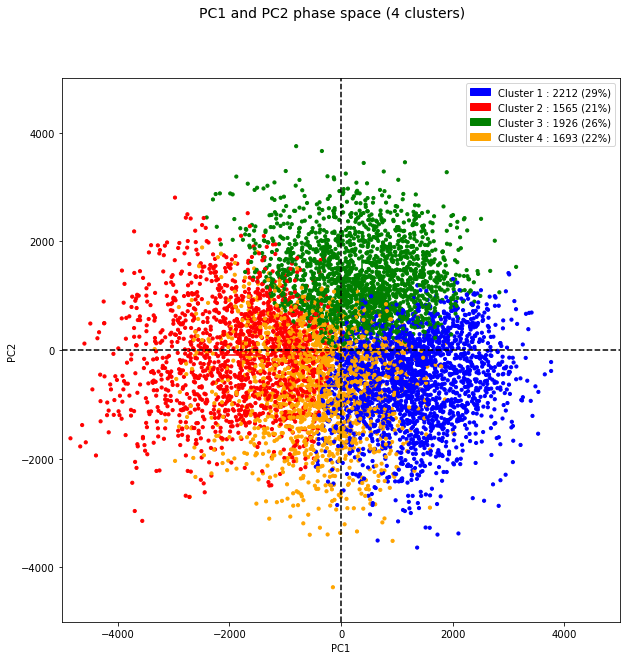

In [30]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
fig.suptitle('PC1 and PC2 phase space (4 clusters)', fontsize=14)
plot_phase_space2d(ax)
plt.scatter(pc1, pc2, c=colors, s=10, label=label)
plt.scatter(centroids[:, 0], centroids[:, 1], c=couleur, s=2000, alpha=1, marker='+');

patch1 = mpatches.Patch(color=couleur[0], label='Cluster 1 : '+str(nc1)+' ('+str(f1)+'%)')
patch2 = mpatches.Patch(color=couleur[1], label='Cluster 2 : '+str(nc2)+' ('+str(f2)+'%)')
patch3 = mpatches.Patch(color=couleur[2], label='Cluster 3 : '+str(nc3)+' ('+str(f3)+'%)')
patch4 = mpatches.Patch(color=couleur[3], label='Cluster 4 : '+str(nc4)+' ('+str(f4)+'%)')
all_handles = (patch1, patch2, patch3, patch4)
leg = ax.legend(handles=all_handles, loc='upper right')

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pc12_clustering'
fig.savefig(figname+'.png', bbox_inches='tight')

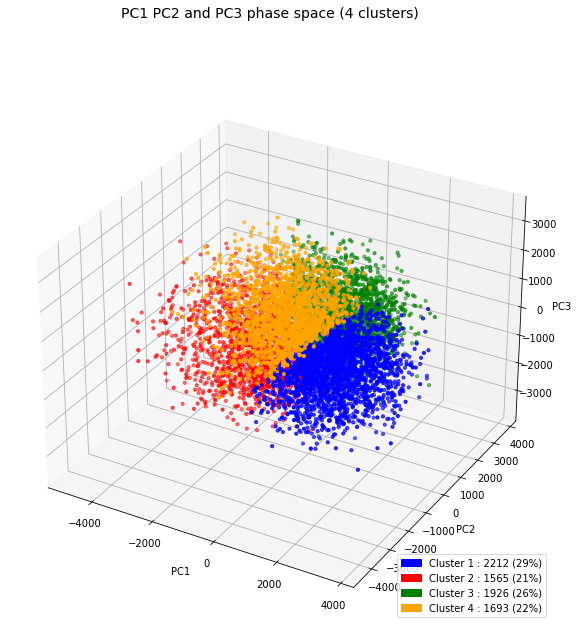

In [31]:
fig = plt.figure(figsize=(10, 10))
fig.suptitle('PC1 PC2 and PC3 phase space (4 clusters)', fontsize=14)
ax = fig.add_subplot(111, projection='3d')
plot_phase_space3d(ax)
ax.scatter(pc1, pc2, pc3, c=colors, s=10, label=label)
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c=couleur, s=2000, alpha=1, marker='+')

patch1 = mpatches.Patch(color=couleur[0], label='Cluster 1 : '+str(nc1)+' ('+str(f1)+'%)')
patch2 = mpatches.Patch(color=couleur[1], label='Cluster 2 : '+str(nc2)+' ('+str(f2)+'%)')
patch3 = mpatches.Patch(color=couleur[2], label='Cluster 3 : '+str(nc3)+' ('+str(f3)+'%)')
patch4 = mpatches.Patch(color=couleur[3], label='Cluster 4 : '+str(nc4)+' ('+str(f4)+'%)')
all_handles = (patch1, patch2, patch3, patch4)
leg = ax.legend(handles=all_handles, loc='lower right')

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pc123_clustering'
fig.savefig(figname+'.png', bbox_inches='tight')

# Etape 5 : obtention des régimes de temps

In [32]:
id_cluster1=np.any([cluster==0],axis=0)
id_cluster2=np.any([cluster==1],axis=0)
id_cluster3=np.any([cluster==2],axis=0)
id_cluster4=np.any([cluster==3],axis=0)

print(id_cluster1)
print(id_cluster2)
print(id_cluster3)
print(id_cluster4)

mean_c1 = var[id_cluster1,:,:].mean(axis=0)
mean_c2 = var[id_cluster2,:,:].mean(axis=0)
mean_c3 = var[id_cluster3,:,:].mean(axis=0)
mean_c4 = var[id_cluster4,:,:].mean(axis=0)

mean_c1_anom = var_anom[id_cluster1,:,:].mean(axis=0)
mean_c2_anom = var_anom[id_cluster2,:,:].mean(axis=0)
mean_c3_anom = var_anom[id_cluster3,:,:].mean(axis=0)
mean_c4_anom = var_anom[id_cluster4,:,:].mean(axis=0)

[False False False ... False False False]
[False False False ...  True  True  True]
[ True  True  True ... False False False]
[False False False ... False False False]


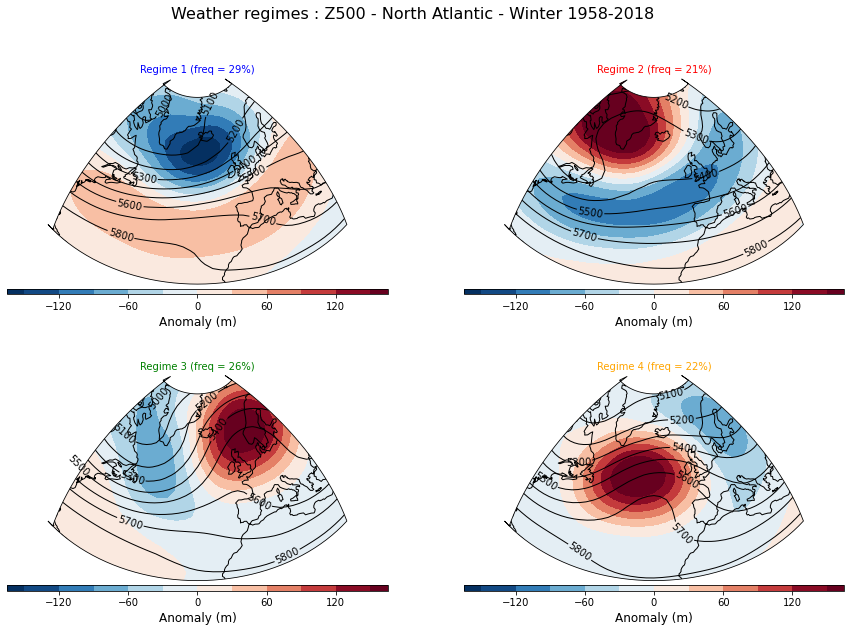

In [33]:
if varname=='zg500':
    clevs = np.linspace(5000, 6000, 11)
    clevs_anom = np.linspace(-150, 150, 11)
if varname=='slp':
    clevs = np.linspace(990, 1020, 15)
    clevs_anom = np.linspace(-8, 8, 17)

fig = plt.figure(figsize=(15, 10))
fig.suptitle('Weather regimes : '+var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)

ax = fig.add_subplot(2, 2, 1, projection=projection)
plt.title('Regime 1 (freq = '+str(f1)+'%)', fontsize=10, loc='center', color=couleur[0])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c1_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c1, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

ax = fig.add_subplot(2, 2, 2, projection=projection)
plt.title('Regime 2 (freq = '+str(f2)+'%)', fontsize=10, loc='center', color=couleur[1])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c2_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c2, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

ax = fig.add_subplot(2, 2, 3, projection=projection)
plt.title('Regime 3 (freq = '+str(f3)+'%)', fontsize=10, loc='center', color=couleur[2])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c3_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c3, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

ax = fig.add_subplot(2, 2, 4, projection=projection)
plt.title('Regime 4 (freq = '+str(f4)+'%)', fontsize=10, loc='center', color=couleur[3])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c4_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c4, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_'+'regimes'
fig.savefig(figname+'.png', bbox_inches='tight')

<div class="alert alert-warning">
<b>Questions : </b>
<p><b>1) </b>Identifier le régime NAO+ (ou régime zonal)
</p>
<p><b>2) </b>Identifier le régime NAO- (ou régime de l'anticyclone Groenlandais)
</p>
<p><b>3) </b>Identifier le régime de Dorsale Atlantique
</p>
<p><b>4) </b>Identifier le régime de Blocage Scandinave
</p>
</div>

<div class="alert alert-success">
<b>Réponse dans la cellule de code ci-dessous </b>
<p>
</p>
</div>

In [34]:
if domain_name=='natl' and season_name=='winter':
    r1=input("Parmi les propositions suivantes nommer le régime 1 : NAO+ / NAO- / Dorsale Atl / Blocage ")
    r2=input("Parmi les propositions suivantes nommer le régime 2 : NAO+ / NAO- / Dorsale Atl / Blocage ")
    r3=input("Parmi les propositions suivantes nommer le régime 3 : NAO+ / NAO- / Dorsale Atl / Blocage ")
    r4=input("Parmi les propositions suivantes nommer le régime 4 : NAO+ / NAO- / Dorsale Atl / Blocage ")

if domain_name=='npac' and season_name=='winter':
    r1=input("Parmi les propositions suivantes nommer le régime 1 : Alaskan Ridge / Arctic Low / Arctic High / Pac Trough ")
    r2=input("Parmi les propositions suivantes nommer le régime 2 : Alaskan Ridge / Arctic Low / Arctic High / Pac Trough ")
    r3=input("Parmi les propositions suivantes nommer le régime 3 : Alaskan Ridge / Arctic Low / Arctic High / Pac Trough ")
    r4=input("Parmi les propositions suivantes nommer le régime 4 : Alaskan Ridge / Arctic Low / Arctic High / Pac Trough ")

if domain_name=='natl' and season_name=='summer':
    r1=input("Parmi les propositions suivantes nommer le régime 1 : Zonal / Anticyclone Gro / Blocage été / Thalweg Atl ")
    r2=input("Parmi les propositions suivantes nommer le régime 2 : Zonal / Anticyclone Gro / Blocage été / Thalweg Atl ")
    r3=input("Parmi les propositions suivantes nommer le régime 3 : Zonal / Anticyclone Gro / Blocage été / Thalweg Atl ")
    r4=input("Parmi les propositions suivantes nommer le régime 4 : Zonal / Anticyclone Gro / Blocage été / Thalweg Atl ")

if domain_name=='npac' and season_name=='summer':
    r1=input("Nommer le régime 1 : ")
    r2=input("Nommer le régime 2 : ")
    r3=input("Nommer le régime 3 : ")
    r4=input("Nommer le régime 4 : ")

regime=[r1, r2, r3, r4]

Parmi les propositions suivantes nommer le régime 1 : NAO+ / NAO- / Dorsale Atl / Blocage NAO+
Parmi les propositions suivantes nommer le régime 2 : NAO+ / NAO- / Dorsale Atl / Blocage NAO-
Parmi les propositions suivantes nommer le régime 3 : NAO+ / NAO- / Dorsale Atl / Blocage Blocage Scand
Parmi les propositions suivantes nommer le régime 4 : NAO+ / NAO- / Dorsale Atl / Blocage Dorsale Atl.


<div class="alert alert-warning">
<b>Question : </b>
<p><b>1) </b>Pour chaque régime, indiquer la circulation dominante (vents) associée sur l’Europe de l’ouest (Grande Bretagne-Benelux-Allemagne-France- Espagne-Suisse-Italie).</p>
</div>

<div class="alert alert-success">
<b>Réponse : </b>
<p>
</p>
</div>

# Etape 6 : temps sensible associé aux régimes de temps

<div class="alert alert-danger">
<b>Etape à faire uniquement pour les régimes de l'Atlantique nord (données non disponibles ailleurs). </b>
</div>

In [35]:
data_t0    = xr.open_dataset(dir_data+'t2m_eur_19790101_20191231.nc')
data_tp0    = xr.open_dataset(dir_data+'tp_eur_19790101_20191231.nc')
print(data_t0)
print(data_tp0)

<xarray.Dataset>
Dimensions:    (time: 14975, bnds: 2, longitude: 201, latitude: 201)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01T09:00:00 ... 2019-12-31T09:00:00
  * longitude  (longitude) float32 -20.0 -19.75 -19.5 -19.25 ... 29.5 29.75 30.0
  * latitude   (latitude) float32 80.0 79.75 79.5 79.25 ... 30.5 30.25 30.0
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    t2m        (time, latitude, longitude) float32 ...
Attributes:
    CDI:          Climate Data Interface version 1.9.9 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Fri Jan 22 23:10:00 2021: cdo daymean 1.nc 2.nc\n2021-01-22...
    frequency:    day
    CDO:          Climate Data Operators version 1.9.9 (https://mpimet.mpg.de...
<xarray.Dataset>
Dimensions:    (time: 14975, bnds: 2, longitude: 201, latitude: 201)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01T15:00:00 ... 2019-12-31T09:00:00
  * longitude  (longitude)

In [36]:
if season_name == 'winter':
    d1='1979-12-01T09'
    d2='2018-03-31T09'

if season_name == 'summer':
    d1='1979-06-01T09'
    d2='2018-09-30T09'

    # Date index from startday to endday
d = pd.date_range(d1, d2, freq='D')
print(d)

# Remove 29/02
#mask = is_leap_and_29Feb(d)
#d=d[~mask]
#print(d)

# Select Season
if season_name == 'winter':
    mm=np.any([d.month==12,d.month==1,d.month==2,d.month==3],axis=0)
if season_name == 'summer':
    mm=np.any([d.month==6,d.month==7,d.month==8,d.month==9],axis=0)

dd2=d[mm]
print(dd2)

data_t    = xr.open_dataset(dir_data+'t2m_eur_19790101_20191231.nc').sel(time=slice(d1,d2))
data_t    = data_t.sel(time=dd2)
data_tp    = xr.open_dataset(dir_data+'tp_eur_19790101_20191231.nc').sel(time=slice(d1,d2))
data_tp    = data_tp.sel(time=dd2)


print(data_t0)
print(data_tp0)
print(data_t)
print(data_tp)

lat_t  = data_t.latitude.values
lon_t  = data_t.longitude.values
time_t  = data_t.time.values

DatetimeIndex(['1979-12-01 09:00:00', '1979-12-02 09:00:00',
               '1979-12-03 09:00:00', '1979-12-04 09:00:00',
               '1979-12-05 09:00:00', '1979-12-06 09:00:00',
               '1979-12-07 09:00:00', '1979-12-08 09:00:00',
               '1979-12-09 09:00:00', '1979-12-10 09:00:00',
               ...
               '2018-03-22 09:00:00', '2018-03-23 09:00:00',
               '2018-03-24 09:00:00', '2018-03-25 09:00:00',
               '2018-03-26 09:00:00', '2018-03-27 09:00:00',
               '2018-03-28 09:00:00', '2018-03-29 09:00:00',
               '2018-03-30 09:00:00', '2018-03-31 09:00:00'],
              dtype='datetime64[ns]', length=14001, freq='D')
DatetimeIndex(['1979-12-01 09:00:00', '1979-12-02 09:00:00',
               '1979-12-03 09:00:00', '1979-12-04 09:00:00',
               '1979-12-05 09:00:00', '1979-12-06 09:00:00',
               '1979-12-07 09:00:00', '1979-12-08 09:00:00',
               '1979-12-09 09:00:00', '1979-12-10 09:00:00',
   

In [37]:
print(' ----- Computing daily anomalies of T2m ----- ')
data_t_anom = data_t.groupby('time.dayofyear') - data_t.groupby('time.dayofyear').mean('time')
print(' ----- Computing daily anomalies of precipitation ----- ')
data_tp_anom = data_tp.groupby('time.dayofyear') - data_tp.groupby('time.dayofyear').mean('time')

t2m_anom=data_t_anom['t2m']
tp_anom=data_tp_anom['tp']*1000

print(t2m_anom.shape)

 ----- Computing daily anomalies of T2m ----- 
 ----- Computing daily anomalies of precipitation ----- 
(4729, 201, 201)


In [38]:
print(cluster.shape)

if season_name=='winter':
    dd1='1979-12-01'
    dd2='2018-03-31'
    
if season_name=='summer':
    dd1='1979-06-01'
    dd2='2018-09-30'

index_y=np.all([dates2>=dd1, dates2<=dd2], axis=0)
cluster_t=cluster[index_y]
print(cluster_t.shape)

id_cluster1_t=np.any([cluster_t==0],axis=0)
id_cluster2_t=np.any([cluster_t==1],axis=0)
id_cluster3_t=np.any([cluster_t==2],axis=0)
id_cluster4_t=np.any([cluster_t==3],axis=0)

mean_c1_anom_t = t2m_anom[id_cluster1_t,:,:].mean(axis=0)
mean_c2_anom_t = t2m_anom[id_cluster2_t,:,:].mean(axis=0)
mean_c3_anom_t = t2m_anom[id_cluster3_t,:,:].mean(axis=0)
mean_c4_anom_t = t2m_anom[id_cluster4_t,:,:].mean(axis=0)

mean_c1_anom_tp = tp_anom[id_cluster1_t,:,:].mean(axis=0)
mean_c2_anom_tp = tp_anom[id_cluster2_t,:,:].mean(axis=0)
mean_c3_anom_tp = tp_anom[id_cluster3_t,:,:].mean(axis=0)
mean_c4_anom_tp = tp_anom[id_cluster4_t,:,:].mean(axis=0)

(7396,)
(4729,)


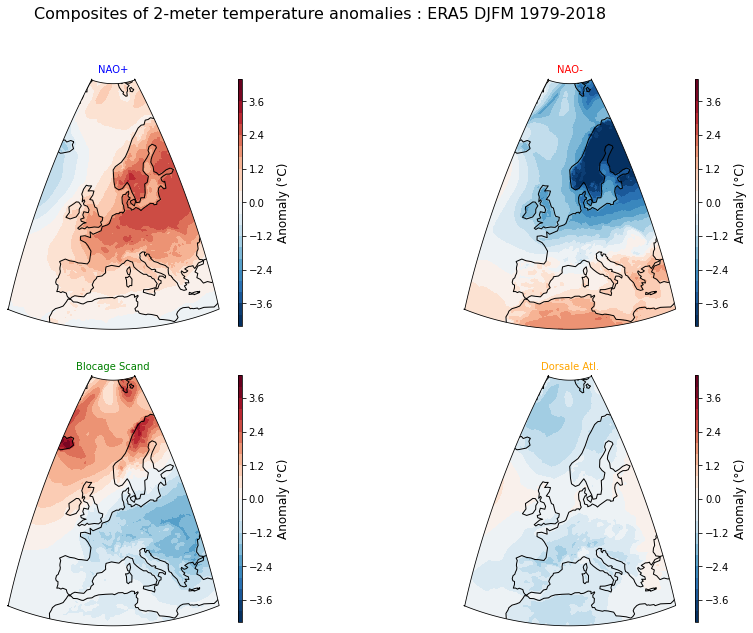

In [39]:
#projection2=ccrs.EuroPP()
#projection2=ccrs.PlateCarree()
projection2=ccrs.NearsidePerspective(central_longitude=5.0, central_latitude=55.0)
bounds = [(-20, 30, 30, 80)]

levs_t_anom = np.linspace(-4, 4, 21)

fig = plt.figure(figsize=(15, 10))
fig.suptitle('Composites of 2-meter temperature anomalies : ERA5 DJFM 1979-2018', fontsize=16)

ax = fig.add_subplot(2, 2, 1, projection=projection2)
plt.title(regime[0], fontsize=10, loc='center', color=couleur[0])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c1_anom_t, levels=levs_t_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (°C)', fontsize=12)

ax = fig.add_subplot(2, 2, 2, projection=projection2)
plt.title(regime[1], fontsize=10, loc='center', color=couleur[1])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c2_anom_t, levels=levs_t_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (°C)', fontsize=12)

ax = fig.add_subplot(2, 2, 3, projection=projection2)
plt.title(regime[2], fontsize=10, loc='center', color=couleur[2])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c3_anom_t, levels=levs_t_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (°C)', fontsize=12)

ax = fig.add_subplot(2, 2, 4, projection=projection2)
plt.title(regime[3], fontsize=10, loc='center', color=couleur[3])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c4_anom_t, levels=levs_t_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (°C)', fontsize=12)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_t2m_composite_DJFM'
fig.savefig(figname+'.png', bbox_inches='tight')

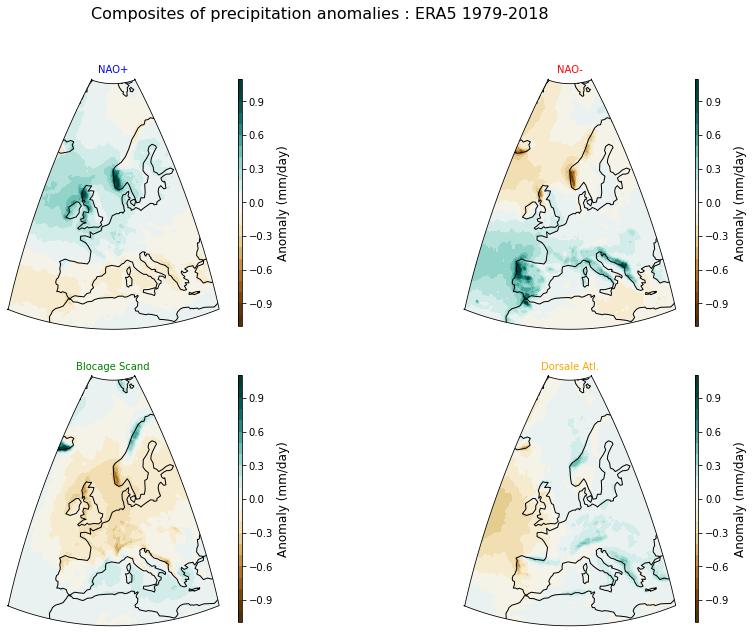

In [40]:
cmap3='BrBG'

levs_tp_anom = np.linspace(-1, 1, 21)

fig = plt.figure(figsize=(15, 10))
fig.suptitle('Composites of precipitation anomalies : ERA5 1979-2018', fontsize=16)

ax = fig.add_subplot(2, 2, 1, projection=projection2)
plt.title(regime[0], fontsize=10, loc='center', color=couleur[0])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c1_anom_tp, levels=levs_tp_anom, 
                 cmap=cmap3, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (mm/day)', fontsize=12)

ax = fig.add_subplot(2, 2, 2, projection=projection2)
plt.title(regime[1], fontsize=10, loc='center', color=couleur[1])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c2_anom_tp, levels=levs_tp_anom, 
                 cmap=cmap3, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (mm/day)', fontsize=12)

ax = fig.add_subplot(2, 2, 3, projection=projection2)
plt.title(regime[2], fontsize=10, loc='center', color=couleur[2])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c3_anom_tp, levels=levs_tp_anom, 
                 cmap=cmap3, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (mm/day)', fontsize=12)

ax = fig.add_subplot(2, 2, 4, projection=projection2)
plt.title(regime[3], fontsize=10, loc='center', color=couleur[3])
ax.coastlines()
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lon_t, lat_t)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lon_t, lat_t, mean_c4_anom_tp, levels=levs_tp_anom, 
                 cmap=cmap3, extend='both', transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='vertical', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly (mm/day)', fontsize=12)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_precip_composite_DJFM'
fig.savefig(figname+'.png', bbox_inches='tight')

<div class="alert alert-warning">
<b>Question : </b>
<p><b>1) </b>Préciser l’impact de chaque régime en temps sensible (température/précipitation) sur l'Europe de l'ouest. Ces impacts sont-ils spatialement homogènes pour tous les régimes ? Sinon, préciser les disparités régionales. S'aider éventuellement des documents suivants :

http://www.cerfacs.fr/~cassou/Regimes/Images/regime_mean_europe.gif
http://blogs.reading.ac.uk/weather-and-climate-at-reading/files/2020/02/RLee-Fig-1.png</p>
</div>

<div class="alert alert-success">
<b>Réponse : </b>
<p>
</p>
</div>

# Etape 7 : étude des occurrences saisonnières des régimes

In [41]:
# Find indexes for end of season
time_str = [x for x in range(len(dates2))]
date_str = [x for x in range(len(dates2))]
for i in range(len(dates2)):
    time_str[i] = str(dates2[i])
    date_str[i] = time_str[i][5:10]

if season_name == 'winter':
    index_end = [i for i, value in enumerate(date_str) if value == '03-31']

if season_name == 'summer':
    index_end = [i for i, value in enumerate(date_str) if value == '08-31']
    
print(index_end)
print(len(index_end))

seasons= [x for x in range(int(season1),int(season2)+1)]
cl1_count=np.zeros(len(index_end))
cl2_count=np.zeros(len(index_end))
cl3_count=np.zeros(len(index_end))
cl4_count=np.zeros(len(index_end))

# Cluster1
cl1_count[0]=list(cluster[0:index_end[0]+1]).count(0)
for i in range(1,len(index_end)):
    cl1_count[i]=list(cluster[index_end[i-1]+1:index_end[i]+1]).count(0)

# Cluster2
cl2_count[0]=list(cluster[0:index_end[0]+1]).count(1)
for i in range(1,len(index_end)):
    cl2_count[i]=list(cluster[index_end[i-1]+1:index_end[i]+1]).count(1)

# Cluster3
cl3_count[0]=list(cluster[0:index_end[0]+1]).count(2)
for i in range(1,len(index_end)):
    cl3_count[i]=list(cluster[index_end[i-1]+1:index_end[i]+1]).count(2)

# Cluster4
cl4_count[0]=list(cluster[0:index_end[0]+1]).count(3)
for i in range(1,len(index_end)):
    cl4_count[i]=list(cluster[index_end[i-1]+1:index_end[i]+1]).count(3)

[120, 241, 363, 484, 605, 726, 848, 969, 1090, 1211, 1333, 1454, 1575, 1696, 1818, 1939, 2060, 2181, 2303, 2424, 2545, 2666, 2788, 2909, 3030, 3151, 3273, 3394, 3515, 3636, 3758, 3879, 4000, 4121, 4243, 4364, 4485, 4606, 4728, 4849, 4970, 5091, 5213, 5334, 5455, 5576, 5698, 5819, 5940, 6061, 6183, 6304, 6425, 6546, 6668, 6789, 6910, 7031, 7153, 7274, 7395]
61


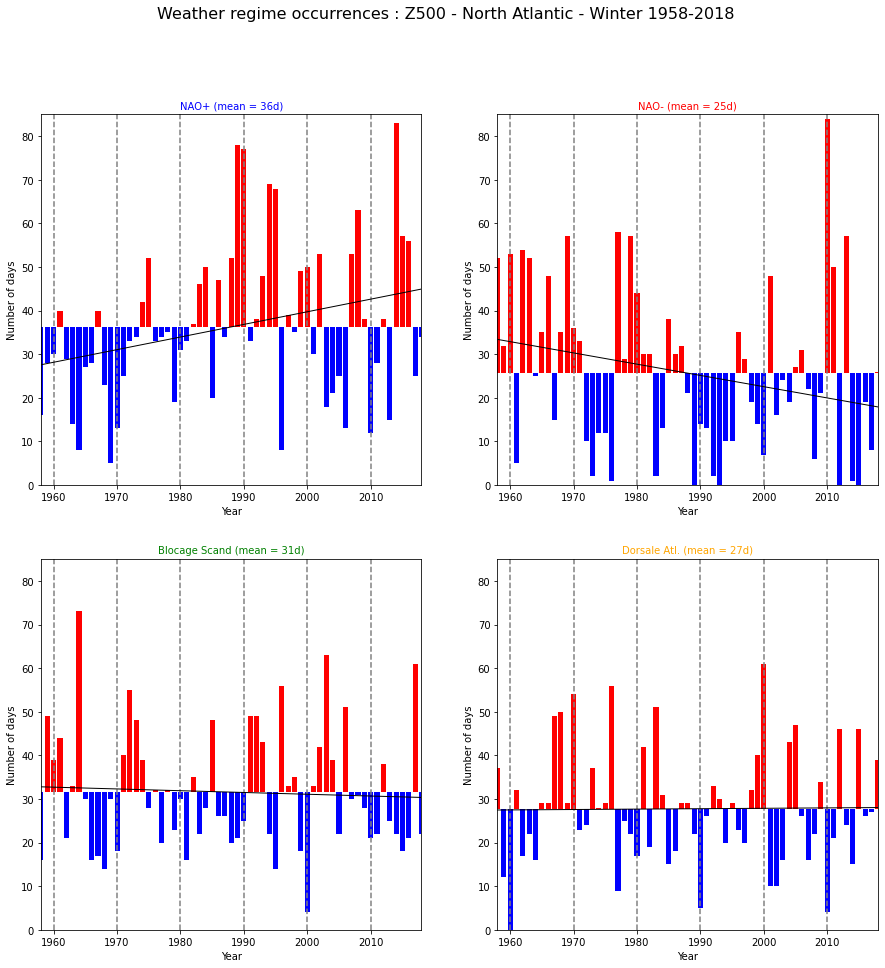

In [42]:
# calculate trends
X = np.reshape(seasons, (len(seasons), 1))

y = cl1_count
model = LinearRegression()
model.fit(X, cl1_count)
trend_cl1 = model.predict(X)

y = cl2_count
model = LinearRegression()
model.fit(X, cl2_count)
trend_cl2 = model.predict(X)

y = cl3_count
model = LinearRegression()
model.fit(X, cl3_count)
trend_cl3 = model.predict(X)

y = cl4_count
model = LinearRegression()
model.fit(X, cl4_count)
trend_cl4 = model.predict(X)

def plot_regimes_occ(ax):
    plt.xlabel('Year')
    plt.ylabel('Number of days')
    plt.xlim(int(season1), int(season2))
    plt.ylim(0, 85)
    plt.axvline(1960, color='grey', linestyle='--')
    plt.axvline(1970, color='grey', linestyle='--')
    plt.axvline(1980, color='grey', linestyle='--')
    plt.axvline(1990, color='grey', linestyle='--')
    plt.axvline(2000, color='grey', linestyle='--')
    plt.axvline(2010, color='grey', linestyle='--')
    return ax

fig = plt.figure(figsize=(15, 15))
fig.suptitle('Weather regime occurrences : '
             +var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)
ax = fig.add_subplot(2, 2, 1)
plt.title(regime[0]+' (mean = '+str(int(cl1_count.mean()))+'d)', fontsize=10, loc='center', color=couleur[0])
plot_regimes_occ(ax)
colormat=np.where(cl1_count>cl1_count.mean(), 'red','blue')
plt.bar(seasons,cl1_count-cl1_count.mean(), bottom=cl1_count.mean(), color=colormat, linewidth=1)
plt.plot(seasons,trend_cl1, color='k', linewidth=1)

ax = fig.add_subplot(2, 2, 2)
plt.title(regime[1]+' (mean = '+str(int(cl2_count.mean()))+'d)', fontsize=10, loc='center', color=couleur[1])
plot_regimes_occ(ax)
colormat=np.where(cl2_count>cl2_count.mean(), 'red','blue')
plt.bar(seasons,cl2_count-cl2_count.mean(), bottom=cl2_count.mean(), color=colormat, linewidth=1)
plt.plot(seasons,trend_cl2, color='k', linewidth=1)

ax = fig.add_subplot(2, 2, 3)
plt.title(regime[2]+' (mean = '+str(int(cl3_count.mean()))+'d)', fontsize=10, loc='center', color=couleur[2])
plot_regimes_occ(ax)
colormat=np.where(cl3_count>cl3_count.mean(), 'red','blue')
plt.bar(seasons,cl3_count-cl3_count.mean(), bottom=cl3_count.mean(), color=colormat, linewidth=1)
plt.plot(seasons,trend_cl3, color='k', linewidth=1)

ax = fig.add_subplot(2, 2, 4)
plt.title(regime[3]+' (mean = '+str(int(cl4_count.mean()))+'d)', fontsize=10, loc='center', color=couleur[3])
plot_regimes_occ(ax)
colormat=np.where(cl4_count>cl4_count.mean(), 'red','blue')
plt.bar(seasons,cl4_count-cl4_count.mean(), bottom=cl4_count.mean(), color=colormat, linewidth=1)
plt.plot(seasons,trend_cl4, color='k', linewidth=1)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_regimes_occurrence'
fig.savefig(figname+'.png', bbox_inches='tight')

<div class="alert alert-warning">
<b>Questions : </b>
<p><b>1) </b>Quels régimes semblent caractérisés par des tendances linéaires sur la période totale des données ?</p>  
<p><b>2) </b>Pour les régimes avec tendance, identifier 2 hivers particuliers qui s’opposent à cette tendance ou au contraire qui accentuent cette tendance.
</p>
</div>

<div class="alert alert-success">
<b>Réponses : </b>
<p>
</p>
</div>

<div class="alert alert-warning">
<b>Question codage : classement des occurences de régimes </b>
<p>Le tableau seasons contient les saisons de l'étude. Le tableau regime fait la correspondance entre le numéro de régime et le nom du régime. Les tableaux cl1_count, cl2_count, cl3_count et cl4_count correspondent aux nombres d'occurences par saison de chaque régime de temps.

- Exploiter ces tableaux pour classer, pour chaque régime, les saisons par ordre croissant d'occurence de régime.

Indication : les fonctions suivantes pourront s'avérer utiles :
- https://numpy.org/doc/stable/reference/generated/numpy.sort.html
- https://numpy.org/doc/stable/reference/generated/numpy.argsort.html
</p>
</div>

<div class="alert alert-success">
<b>Réponse dans la cellule de code ci-dessous : </b>
<p>
</p>
</div>

In [43]:
print(seasons)
print(regime)
print(cl1_count)
print(cl2_count)
print(cl3_count)
print(cl4_count)

print("Classement "+regime[0])
print(np.sort(cl1_count))
rank=[]
for i in np.argsort(cl1_count):
    rank.append(seasons[i]) 
print(rank)
print("****************************************************")

print("Classement "+regime[1])
print(np.sort(cl2_count))
rank=[]
for i in np.argsort(cl2_count):
    rank.append(seasons[i]) 
print(rank)
print("****************************************************")

print("Classement "+regime[2])
print(np.sort(cl3_count))
rank=[]
for i in np.argsort(cl3_count):
    rank.append(seasons[i]) 
print(rank)
print("****************************************************")

print("Classement "+regime[3])
print(np.sort(cl4_count))
rank=[]
for i in np.argsort(cl4_count):
    rank.append(seasons[i]) 
print(rank)
print("****************************************************")

[1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
['NAO+', 'NAO-', 'Blocage Scand', 'Dorsale Atl.']
[16. 28. 30. 40. 29. 14.  8. 27. 28. 40. 23.  5. 13. 25. 33. 34. 42. 52.
 33. 34. 35. 19. 31. 33. 37. 46. 50. 20. 47. 34. 52. 78. 77. 33. 38. 48.
 69. 68.  8. 39. 35. 49. 50. 30. 53. 18. 21. 25. 13. 53. 63. 38. 12. 28.
 38. 15. 83. 57. 56. 25. 34.]
[52. 32. 53.  5. 54. 52. 25. 35. 48. 15. 35. 57. 36. 33. 10.  2. 12. 12.
  1. 58. 29. 57. 44. 30. 30.  2. 13. 38. 30. 32. 21.  0. 14. 13.  2.  0.
 10. 10. 35. 29. 19. 14.  7. 48. 16. 24. 19. 27. 31. 22.  6. 21. 84. 50.
  0. 57.  1.  0. 19.  8. 26.]
[16. 49. 39. 44. 21. 33. 73. 30. 16. 17. 14. 30. 18. 40. 55. 48. 39. 28.
 32. 20. 32.

<div class="alert alert-warning">
<b>Questions : </b>
<p><b>1) </b>Quels sont les 3 hivers avec le plus (resp. moins) de régimes NAO+ ?</p>
<p><b>2) </b>Quels sont les 3 hivers avec le plus (resp. moins) de régimes NAO- ?</p>
<p><b>3) </b>Citer un hiver récent caractérisé par un nombre important de situations de blocage scandinave. ?</p>
<p><b>4) </b>Citer un hiver récent caractérisé par un nombre important de situations de dorsale Atlantique.</p>
</div>

<div class="alert alert-success">
<b>Réponses : </b>
<p>
</p>
</div>

# Etape 8 : corrélation régimes/indices océaniques (Nino 3.4, TNA, AMV)

<div class="alert alert-danger">
<b>Etape à faire uniquement pour les régimes d'hiver (code à adapter pour l'été). </b>
</div>

In [44]:
#nino=np.loadtxt(dir_data+'nina34.1958-2018.data')
nino=np.loadtxt(dir_data+'nino34.anom.1958-2018.data')
tna=np.loadtxt(dir_data+'tna.1958-2018.data')
amo=np.loadtxt(dir_data+'amon.us.1958-2018.data')

dates = pd.date_range(season1, '2019', freq='M')

nino=nino[0:,1:]
nino=nino.flatten()
nino = Series(nino, index=dates)
print(nino)
nino=nino.rolling(window=3, center=False).mean()
nino=nino[nino.index.month == 3]
nino=(nino-nino.mean())/nino.std()
print(nino)

tna=tna[0:,1:]
tna=tna.flatten()
tna = Series(tna, index=dates)
print(tna)
tna=tna.rolling(window=3, center=False).mean()
tna=tna[tna.index.month == 3]
tna=(tna-tna.mean())/tna.std()
print(tna)

amo=amo[0:,1:]
amo=amo.flatten()
amo = Series(amo, index=dates)
print(amo)
amo=amo.rolling(window=3, center=False).mean()
amo=amo[amo.index.month == 3]
amo=(amo-amo.mean())/amo.std()
print(amo)

years=np.arange(int(season1),2019)

1958-01-31    1.54
1958-02-28    1.40
1958-03-31    0.99
1958-04-30    0.31
1958-05-31    0.32
              ... 
2018-08-31    0.05
2018-09-30    0.30
2018-10-31    0.84
2018-11-30    1.00
2018-12-31    0.97
Freq: M, Length: 732, dtype: float64
1958-03-31    1.475957
1959-03-31    0.464678
1960-03-31   -0.085251
1961-03-31   -0.052034
1962-03-31   -0.277173
                ...   
2014-03-31   -0.321463
2015-03-31    0.630764
2016-03-31    2.339604
2017-03-31   -0.136923
2018-03-31   -0.830793
Length: 61, dtype: float64
1958-01-31    0.25
1958-02-28    0.66
1958-03-31    0.91
1958-04-30    0.92
1958-05-31    0.72
              ... 
2018-08-31    0.01
2018-09-30    0.33
2018-10-31    0.29
2018-11-30   -0.01
2018-12-31   -0.04
Freq: M, Length: 732, dtype: float64
1958-03-31    1.413885
1959-03-31    0.195810
1960-03-31    0.041278
1961-03-31   -0.322326
1962-03-31    0.441243
                ...   
2014-03-31   -0.513219
2015-03-31   -0.085984
2016-03-31    0.977560
2017-03-31    0.53214

In [45]:
def plot_ocean(ax):
    plt.title('Data : https://www.esrl.noaa.gov/psd/data/climateindices/list/' , fontsize=12, color='grey')
    plt.xlabel('Year')
    plt.ylabel('SST anomaly (K)')
    plt.xlim(int(season1), 2018)
    plt.axvline(1960, color='grey', linestyle='--', linewidth=0.5)
    plt.axvline(1970, color='grey', linestyle='--', linewidth=0.5)
    plt.axvline(1980, color='grey', linestyle='--', linewidth=0.5)
    plt.axvline(1990, color='grey', linestyle='--', linewidth=0.5)
    plt.axvline(2000, color='grey', linestyle='--', linewidth=0.5)
    plt.axvline(2010, color='grey', linestyle='--', linewidth=0.5)

    plt.axhline(0, color='k')
    plt.axhline(1, color='grey', linestyle='--', linewidth=0.5)
    plt.axhline(1.5, color='grey', linestyle='--', linewidth=0.5)
    plt.axhline(2, color='grey', linestyle='--', linewidth=0.5)
    plt.axhline(-1, color='grey', linestyle='--', linewidth=0.5)
    plt.axhline(-1.5, color='grey', linestyle='--', linewidth=0.5)
    plt.axhline(-2, color='grey', linestyle='--', linewidth=0.5)
    return ax

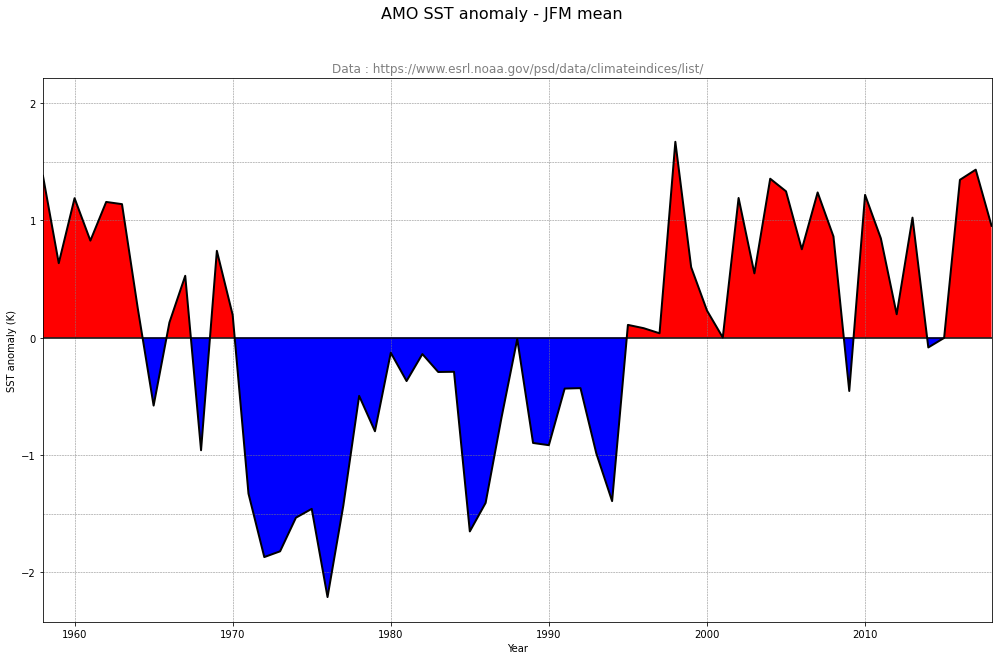

In [46]:
fig=plt.figure(figsize=(17, 10))
fig.suptitle('AMO SST anomaly - JFM mean', fontsize=16)
plot_ocean(ax)
plt.plot(years, amo, color='black', linewidth=2)
plt.fill_between(years, amo, where=amo > 0, facecolor='red', interpolate=True) 
plt.fill_between(years, amo, where=amo < 0, facecolor='blue', interpolate=True) 
plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_AMO'
fig.savefig(figname+'.png', bbox_inches='tight')

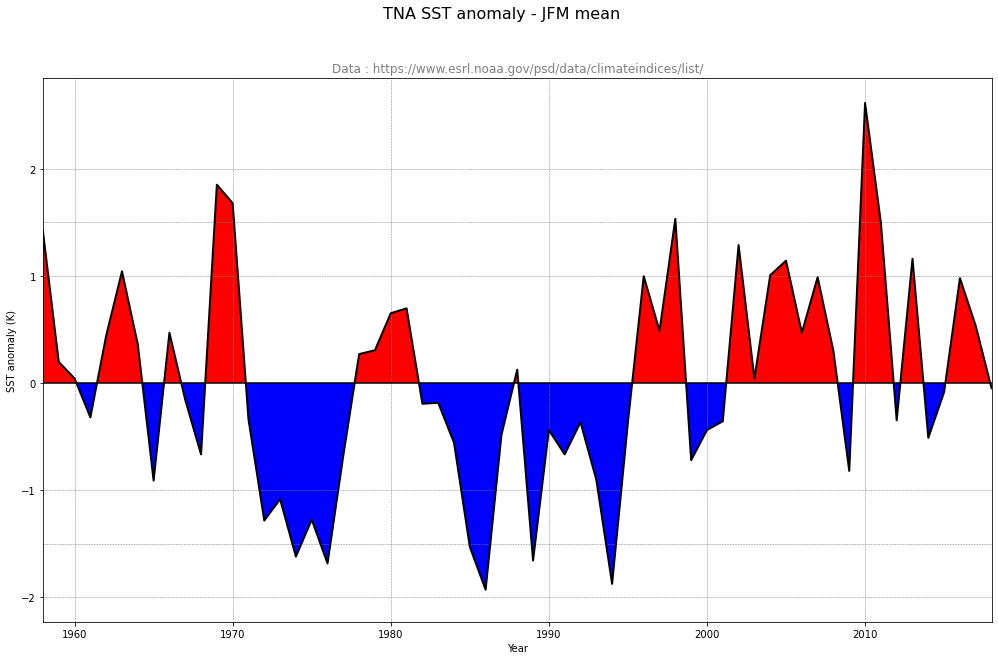

In [47]:
fig=plt.figure(figsize=(17, 10))
fig.suptitle('TNA SST anomaly - JFM mean', fontsize=16)
plot_ocean(ax)
plt.plot(years, tna, color='black', linewidth=2)
plt.fill_between(years, tna, where=tna > 0, facecolor='red', interpolate=True) 
plt.fill_between(years, tna, where=tna < 0, facecolor='blue', interpolate=True) 

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_TNA'
fig.savefig(figname+'.png', bbox_inches='tight')

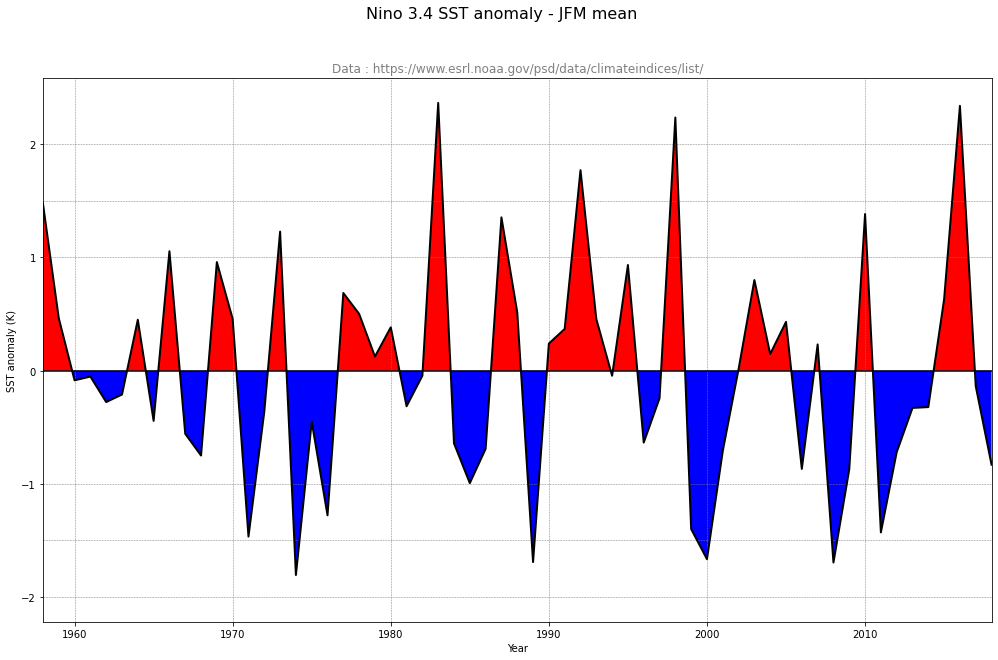

In [48]:
fig=plt.figure(figsize=(17, 10))
fig.suptitle('Nino 3.4 SST anomaly - JFM mean', fontsize=16)
plot_ocean(ax)
plt.plot(years, nino, color='black', linewidth=2)
plt.fill_between(years, nino, where=nino > 0, facecolor='red', interpolate=True) 
plt.fill_between(years, nino, where=nino < 0, facecolor='blue', interpolate=True)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_Nino'
fig.savefig(figname+'.png', bbox_inches='tight')

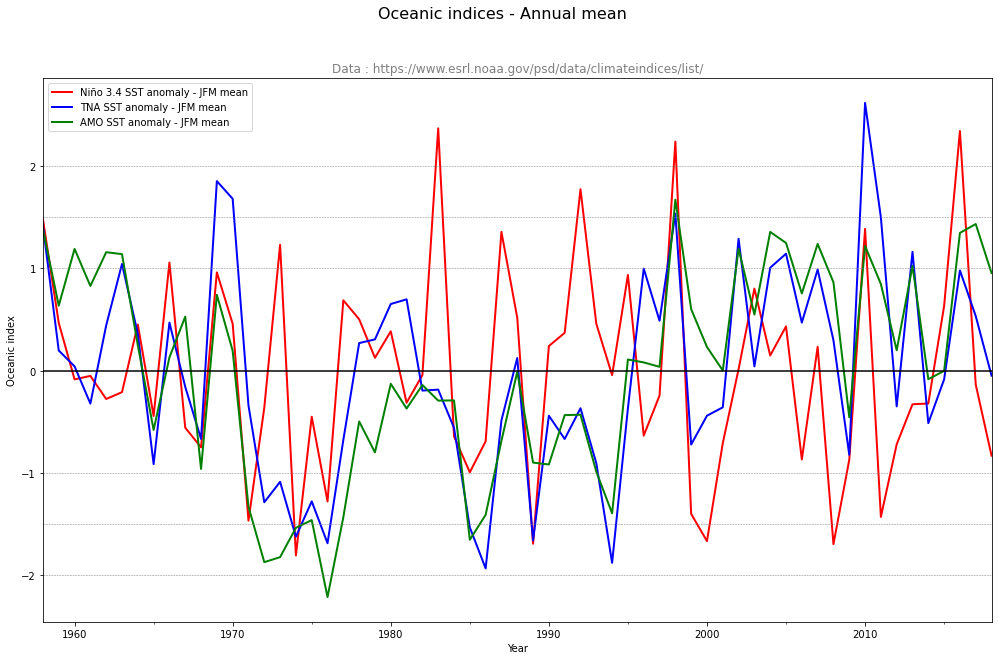

In [49]:
fig=plt.figure(figsize=(17, 10))
fig.suptitle('Oceanic indices - Annual mean', fontsize=16)
plt.title('Data : https://www.esrl.noaa.gov/psd/data/climateindices/list/' , fontsize=12, color='grey')
plt.xlabel('Year')
plt.ylabel('Oceanic index')
ax = nino.plot(color='red', linewidth=2, label='Niño 3.4 SST anomaly - JFM mean')
ax = tna.plot(color='blue', linewidth=2, label='TNA SST anomaly - JFM mean')
ax = amo.plot(color='green', linewidth=2, label='AMO SST anomaly - JFM mean')

plt.axhline(0, color='k')
plt.axhline(1, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(1.5, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(2, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(-1, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(-1.5, color='grey', linestyle='--', linewidth=0.5)
plt.axhline(-2, color='grey', linestyle='--', linewidth=0.5)

plt.legend()
plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_cor_regimes_ocean'
fig.savefig(figname+'.png', bbox_inches='tight')

In [50]:
cl1_count_a=((cl1_count-cl1_count.mean())/cl1_count.mean())*100
cl2_count_a=((cl2_count-cl2_count.mean())/cl2_count.mean())*100
cl3_count_a=((cl3_count-cl3_count.mean())/cl3_count.mean())*100
cl4_count_a=((cl4_count-cl4_count.mean())/cl4_count.mean())*100
print(cl1_count_a)

[-55.87703436 -22.78481013 -17.26943942  10.3074141  -20.02712477
 -61.39240506 -77.93851718 -25.54249548 -22.78481013  10.3074141
 -36.57323689 -86.21157324 -64.15009042 -31.05786618  -8.99638336
  -6.23869801  15.82278481  43.39963834  -8.99638336  -6.23869801
  -3.48101266 -47.6039783  -14.51175407  -8.99638336   2.03435805
  26.85352622  37.88426763 -44.84629295  29.61121157  -6.23869801
  43.39963834 115.0994575  112.34177215  -8.99638336   4.7920434
  32.36889693  90.28028933  87.52260398 -77.93851718   7.54972875
  -3.48101266  35.12658228  37.88426763 -17.26943942  46.15732369
 -50.36166365 -42.08860759 -31.05786618 -64.15009042  46.15732369
  73.73417722   4.7920434  -66.90777577 -22.78481013   4.7920434
 -58.63471971 128.88788427  57.1880651   54.43037975 -31.05786618
  -6.23869801]


In [51]:
cor_nino1=np.corrcoef(nino, cl1_count_a)
cor_nino2=np.corrcoef(nino, cl2_count_a)
cor_nino3=np.corrcoef(nino, cl3_count_a)
cor_nino4=np.corrcoef(nino, cl4_count_a)

print("NINO34 correlation")
print(regime[0]+" : ", cor_nino1[1,0])
print(regime[1]+" : ", cor_nino2[1,0])
print(regime[2]+" : ", cor_nino3[1,0])
print(regime[3]+" : ", cor_nino4[1,0])

cor_tna1=np.corrcoef(tna, cl1_count_a)
cor_tna2=np.corrcoef(tna, cl2_count_a)
cor_tna3=np.corrcoef(tna, cl3_count_a)
cor_tna4=np.corrcoef(tna, cl4_count_a)
print("TNA correlation")
print(regime[0]+" : ", cor_tna1[1,0])
print(regime[1]+" : ", cor_tna2[1,0])
print(regime[2]+" : ", cor_tna3[1,0])
print(regime[3]+" : ", cor_tna4[1,0])

cor_amo1=np.corrcoef(amo, cl1_count_a)
cor_amo2=np.corrcoef(amo, cl2_count_a)
cor_amo3=np.corrcoef(amo, cl3_count_a)
cor_amo4=np.corrcoef(amo, cl4_count_a)
print("AMO correlation")
print(regime[0]+" : ", cor_amo1[1,0])
print(regime[1]+" : ", cor_amo2[1,0])
print(regime[2]+" : ", cor_amo3[1,0])
print(regime[3]+" : ", cor_amo4[1,0])

NINO34 correlation
NAO+ :  -0.10514720110607509
NAO- :  0.10869389611857773
Blocage Scand :  0.020220094110615067
Dorsale Atl. :  -0.03990361128269877
TNA correlation
NAO+ :  -0.465818731674732
NAO- :  0.5305277233315637
Blocage Scand :  -0.06438531155072033
Dorsale Atl. :  -0.07561690285031372
AMO correlation
NAO+ :  -0.21982957037664713
NAO- :  0.27049148150574226
Blocage Scand :  -0.04019515907419458
Dorsale Atl. :  -0.05431887100850604


<div class="alert alert-warning">
<b>Question : </b>
<p><b>1) </b>Quelles sont les corrélations les plus fortes entre régimes de temps et indices océaniques en hiver ?</p>
</div>

<div class="alert alert-success">
<b>Réponse : </b>
<p>
</p>
</div>

# Etape 9 : retour sur une saison particulière

In [52]:
if season_name == 'winter':
    choix=input('hiver (pour un hiver N-N+1, entrer N) : ')
    leap_year=calendar.isleap(int(choix)+1)
    date1=choix+'-12-01'
    idx_date1=dates2.get_loc(date1, method ='ffill')
    if leap_year:
        print('Année bisextile')
        idx_date2=idx_date1+122
    else:
        idx_date2=idx_date1+121
    
if season_name == 'summer':
    choix=input('été ? ')
    date1=choix+'-06-01'
    idx_date1=dates2.get_loc(date1, method ='ffill')
    idx_date2=idx_date1+121

hiver (pour un hiver N-N+1, entrer N) : 2011
Année bisextile


In [53]:
time=dates2[idx_date1:idx_date2]
print(time.shape)

date1=str(time[0])[0:10]
date2=str(time[-1])[0:10]
print(date1)
print(date2)

time_str = [x for x in range(len(time))]
date_str = [x for x in range(len(time))]
date_str_title = [x for x in range(len(time))]

for i in range(len(time)):
    time_str[i] = str(time[i])
    date_str_title[i] = time_str[i][0:10]	
    date_str[i] = time_str[i][5:10]
    
leap_year=calendar.isleap(int(time_str[-1][0:4]))
if leap_year:
    print('Année bisextile')

(122,)
2011-12-01
2012-03-31
Année bisextile


In [54]:
data_month    = data_season.sel(time=slice(date1,date2))
z=data_month[varname]/var_div

data_month_anom    = data_anom.sel(time=slice(date1,date2))
z_anom=data_month_anom[varname]/var_div

lat  = data_month_anom.lat.values
lon  = data_month_anom.lon.values

In [55]:
if varname=='zg500':
    plt_title2 = 'Geopotential height anomaly ('+units+') at 500 hPa : '+ str(date1)+'-'+str(date2)

if varname=='slp':
    plt_title2 = 'Mean Sea Level Pressure anomaly ('+units+') : '+ str(date1)+'-'+str(date2)

In [56]:
for i in range(len(time)):
    #print(date_str_title[i])
    reg=cluster[idx_date1+i]
    if reg==0:
            composite  = mean_c1_anom
            composite_mean = mean_c1
    if reg==1:
            composite  = mean_c2_anom
            composite_mean = mean_c2
    if reg==2:
            composite  = mean_c3_anom
            composite_mean = mean_c3
    if reg==3:
            composite  = mean_c4_anom
            composite_mean = mean_c4
            
    fig = plt.figure(figsize=(15., 5.))
    fig.suptitle(plt_title2, fontsize=16)
    
    ax = fig.add_subplot(1,2,1, projection=projection)
    ax.set_title(date_str_title[i]+' '+regime[reg], fontsize=10, color=colors[idx_date1+i])
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    p1 = ax.contourf(lon, lat, z_anom[i,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    p3 = ax.contour(lon, lat, z[i,:,:], levels1, colors='black', linewidths=1, transform=ccrs.PlateCarree())
    ax.clabel(p3, inline=1, fmt='%4.0f', fontsize=10)
    cb = fig.colorbar(p1, orientation='horizontal', aspect=65, shrink=0.5, pad=0.05, extendrect='True')
    cb.set_label('Anomaly ('+units+')', fontsize=12)
    
    ax = fig.add_subplot(1,2,2, projection=projection)
    plt.title(regime[reg]+' composite', fontsize=10, loc='center', color=colors[idx_date1+i])
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    cf = ax.contourf(lons, lats, composite, levels=clevs_anom, 
                     cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
    c0 = ax.contour(lons, lats, composite, levels=clevs_anom, colors='black', linewidths=0.2,
                    transform=ccrs.PlateCarree())
    c = ax.contour(lons, lats, composite_mean, levels=clevs, colors='black', linewidths=1,
                   transform=ccrs.PlateCarree())
    ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
    cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=0.5, pad=0.05, extendrect='True')
    cb.set_label('Anomaly ('+units+')', fontsize=12)

    figname=dir_anim+varname+'_anom_cluster'+domain_name+'_'+season_name+'_'+date_str_title[i]
    fig.savefig(figname+'.png', bbox_inches='tight')
    plt.close()
print('png files are in the animation folder, ready to make the animation')

png files are in the animation folder, ready to make the animation


In [57]:
gif_filepath = dir_anim+varname+'_anom_cluster_'+domain_name+'_'+season_name+'_'+str(date1)+'-'+str(date2)+'.gif'
make_animation()
IPdisplay.Image(url=gif_filepath)

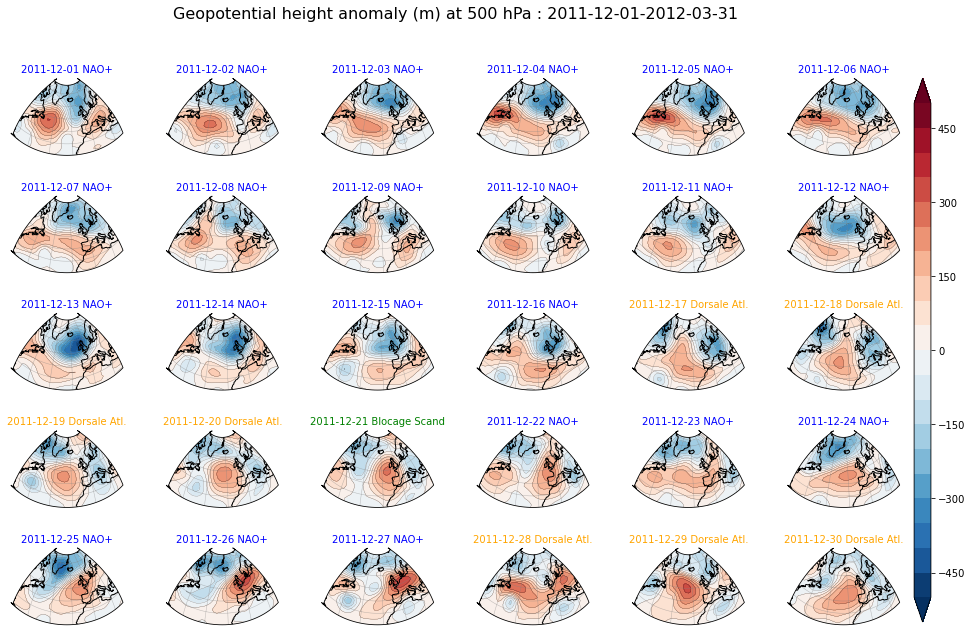

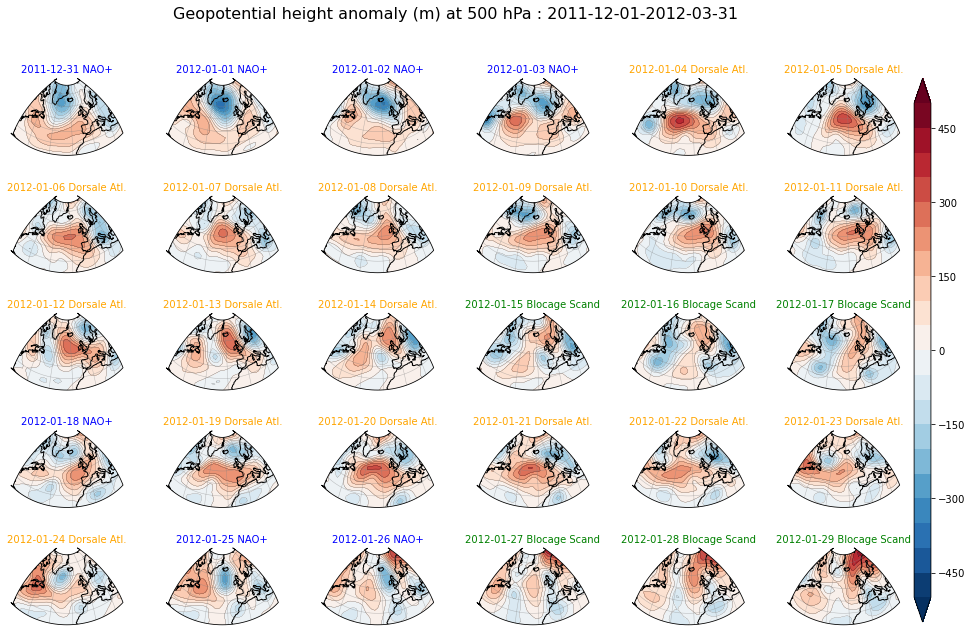

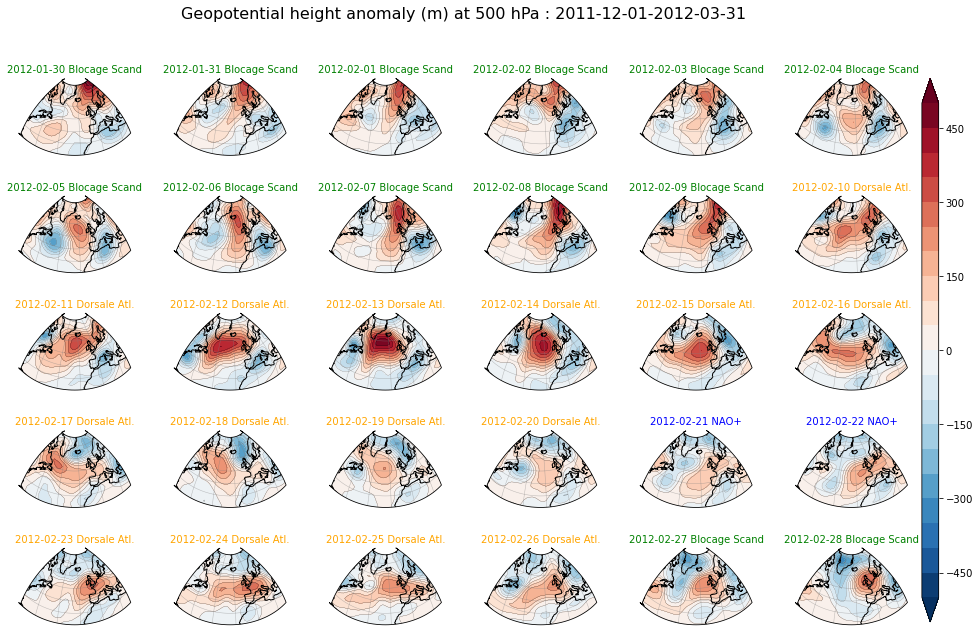

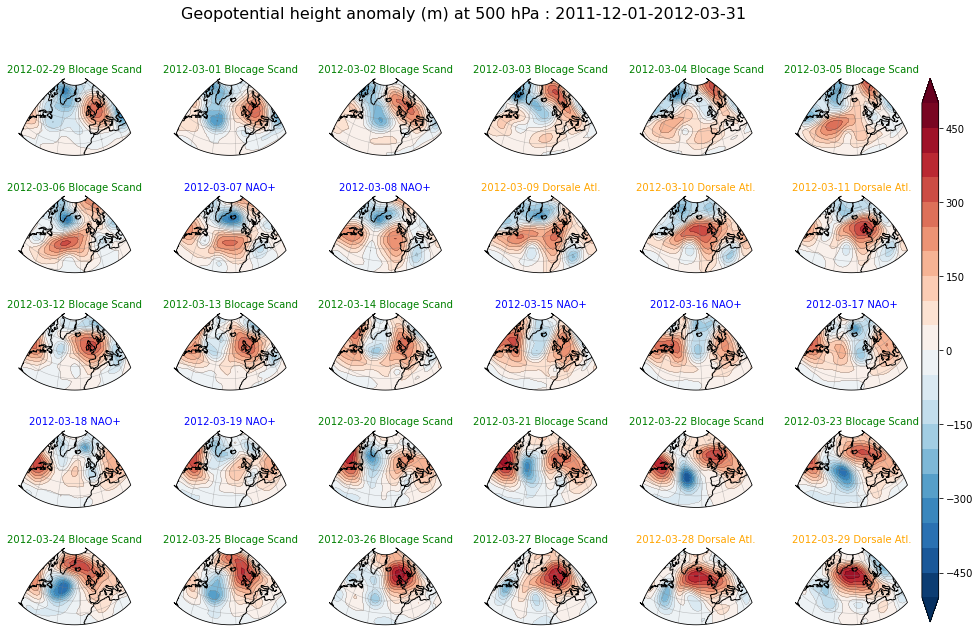

In [58]:
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    reg=cluster[idx_date1+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i]+' '+regime[reg], fontsize=10, color=colors[idx_date1+i])
    p1 = ax.contourf(lon, lat, z_anom[i,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i,:,:], levels2, colors='black', linewidths=0.2,
                    transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster_'+str(date1)+'-'+str(date2)+'_1'
fig.savefig(figname+'.png', bbox_inches='tight')

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    reg=cluster[idx_date1+30+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i+30]+' '+regime[reg], fontsize=10, color=colors[idx_date1+i+30])
    p1 = ax.contourf(lon, lat, z_anom[i+30,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i+30,:,:], levels2, colors='black', linewidths=0.2,
                    transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster_'+str(date1)+'-'+str(date2)+'_2'
fig.savefig(figname+'.png', bbox_inches='tight')

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    reg=cluster[idx_date1+60+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i+60]+' '+regime[reg], fontsize=10, color=colors[idx_date1+i+60])
    p1 = ax.contourf(lon, lat, z_anom[i+60,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i+60,:,:], levels2, colors='black', linewidths=0.2,
                    transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster_'+str(date1)+'-'+str(date2)+'_3'
fig.savefig(figname+'.png', bbox_inches='tight')

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    reg=cluster[idx_date1+90+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i+90]+' '+regime[reg], fontsize=10, color=colors[idx_date1+i+90])
    p1 = ax.contourf(lon, lat, z_anom[i+90,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i+90,:,:], levels2, colors='black', linewidths=0.2,
                    transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster_'+str(date1)+'-'+str(date2)+'_4'
fig.savefig(figname+'.png', bbox_inches='tight')

In [59]:
nc1s=list(cluster[idx_date1:idx_date2]).count(0)
nc2s=list(cluster[idx_date1:idx_date2]).count(1)
nc3s=list(cluster[idx_date1:idx_date2]).count(2)
nc4s=list(cluster[idx_date1:idx_date2]).count(3)

f1s=int(nc1s/cluster[idx_date1:idx_date2].shape[0]*100)
f2s=int(nc2s/cluster[idx_date1:idx_date2].shape[0]*100)
f3s=int(nc3s/cluster[idx_date1:idx_date2].shape[0]*100)
f4s=int(nc4s/cluster[idx_date1:idx_date2].shape[0]*100)

In [60]:
def plot_regimes_leg(ax):
    patch1 = mpatches.Patch(color=couleur[0], label=regime[0]+' : '+str(nc1s)+' ('+str(f1s)+'%)')
    patch2 = mpatches.Patch(color=couleur[1], label=regime[1]+' : '+str(nc2s)+' ('+str(f2s)+'%)')
    patch3 = mpatches.Patch(color=couleur[2], label=regime[2]+' : '+str(nc3s)+' ('+str(f3s)+'%)')
    patch4 = mpatches.Patch(color=couleur[3], label=regime[3]+' : '+str(nc4s)+' ('+str(f4s)+'%)')
    all_handles = (patch1, patch2, patch3, patch4)
    leg = ax.legend(handles=all_handles, loc='lower right')
    return ax

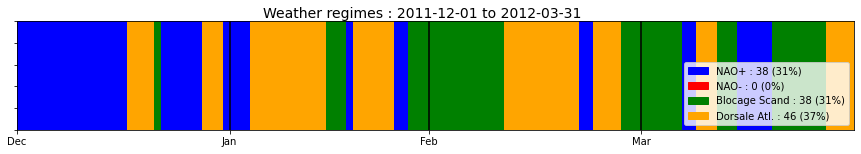

In [61]:
fig = plt.figure(figsize=(15, 2))
fig.suptitle('Weather regimes : '+date_str_title[0]+' to '+date_str_title[-1], fontsize=14)

ax = fig.add_subplot(1, 1, 1)

# create a collection with a rectangle for each day
col = PatchCollection([Rectangle((y, 0), 1, 1) for y in range(len(time))])

#data = cluster[idx_date1:idx_date2]
#col.set_array(data)
col.set_color(colors[idx_date1:idx_date2])
ax.add_collection(col)

if season_name == 'winter':
    labels = ("Dec", "Jan", "Feb", "Mar", "Avr")
    positions = (0, 31, 31+31, 31+31+28, 31+31+28+31)
    if leap_year:
        positions = (0, 31, 31+31, 31+31+29, 31+31+29+31)

if season_name == 'summer':
    positions = (0, 30, 30+31, 30+31+31, 30+31+31+30)
    labels = ("Jun", "Jul", "Aug", "Sep", "Oct")

plt.xticks(positions, labels)
ax.set_ylim(0, 1)
ax.set_xlim(0, len(time))
ax.yaxis.set_major_formatter(plt.NullFormatter())
plt.axvline(x=positions[0], c='black')
plt.axvline(x=positions[1], c='black')
plt.axvline(x=positions[2], c='black')
plt.axvline(x=positions[3], c='black')

plot_regimes_leg(ax)

fig.savefig(dir_figs+varname+'_'+domain_name+'_'+season_name+
            '_regimes-stripes_'+date_str_title[0]+'-'+date_str_title[-1]+'.png', bbox_inches='tight')

<div class="alert alert-warning">
<b>Questions : </b>
<p><b>1) </b>Quels sont les régimes de temps dominant du mois de décembre 2011 ?</p>
<p><b>2) </b>Quel régime de temps a été absent au cours de l'hiver 2011-2012 ?</p>
<p><b>3) </b>Quel régime de temps a dominé en début de mois de février 2012 ? Quelle en a été la conséquence sur le temps sensible en France ?</p>
<p><b>4) </b>Quel a été le régime de temps dominant au cours de l'hiver 2009-2010 ?  Au cours de quel mois les occurrences de ce régime ont-elles été les plus nombreuses ?</p>
</div>

<div class="alert alert-success">
<b>Réponses : </b>
<p>
</p>
</div>

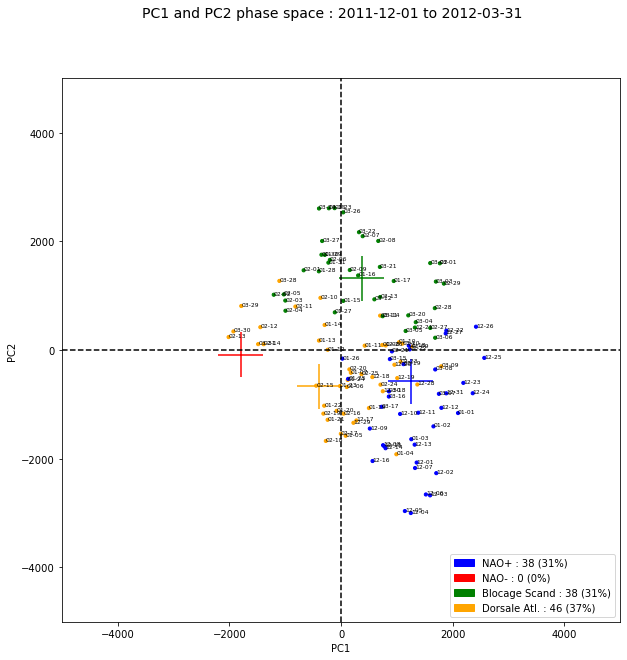

In [62]:
fig = plt.figure(figsize=(10, 10))
fig.suptitle('PC1 and PC2 phase space : '+date_str_title[0]+' to '+date_str_title[-1], fontsize=14)

ax = fig.add_subplot(1, 1, 1)
plot_phase_space2d(ax)
ax.scatter(pcs[idx_date1:idx_date2,0], pcs[idx_date1:idx_date2,1], c=colors[idx_date1:idx_date2], s=10)
ax.scatter(centroids[:, 0], centroids[:, 1], c=couleur, s=2000, alpha=1, marker='+')

for i,type in enumerate(date_str):
    x = pc1[idx_date1+i]
    y = pc2[idx_date1+i]
    plt.text(x, y, type, fontsize=6)

plot_regimes_leg(ax)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pc12_'+date_str_title[0]+'-'+date_str_title[-1]
fig.savefig(figname+'.png', bbox_inches='tight')

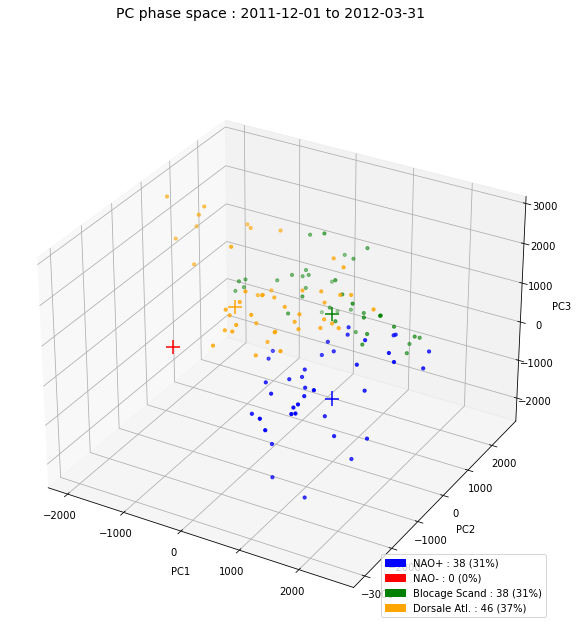

In [63]:
fig = plt.figure(figsize=(10, 10))
fig.suptitle('PC phase space : '+date_str_title[0]+' to '+date_str_title[-1], fontsize=14)

ax = fig.add_subplot(111, projection='3d')
plot_phase_space3d(ax)
ax.scatter(pcs[idx_date1:idx_date2,0], pcs[idx_date1:idx_date2,1], pcs[idx_date1:idx_date2,2],
           c=colors[idx_date1:idx_date2], s=10)
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c=couleur, s=200, alpha=1, marker='+')

plot_regimes_leg(ax)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_pc123_'+date_str_title[0]+'-'+date_str_title[-1]
fig.savefig(figname+'.png', bbox_inches='tight')

In [64]:
# loop for each day	
for i in range(len(time)):
    #print(date_str[i])
    fig = plt.figure(figsize=(10, 10))
    fig.suptitle('PC1 and PC2 phase space : '+date_str_title[0]+' to '+date_str_title[-1], fontsize=14)
    ax = fig.add_subplot(1, 1, 1)
    plot_phase_space2d(ax)
    ax.scatter(pcs[idx_date1:idx_date1+i+1,0], pcs[idx_date1:idx_date1+i+1,1], 
               c=colors[idx_date1:idx_date1+i+1], s=10)

    ax.scatter(centroids[:, 0], centroids[:, 1], c=couleur, s=2000, alpha=1, marker='+')
    x = pc1[idx_date1+i]
    y = pc2[idx_date1+i]
    plt.text(x, y, date_str[i], fontsize=10)
    plot_regimes_leg(ax)
    figname=dir_anim+varname+'_'+domain_name+'_'+season_name+'_PC_2d_phase_space_4clusters_'+date_str_title[i]
    fig.savefig(figname+'.png')
    plt.close()

In [65]:
gif_filepath = dir_anim+varname+'_'+domain_name+'_'+season_name+'_PC_2d_phase_space_4clusters_'+date_str_title[0]+'-'+date_str_title[-1]+'.gif'
make_animation()
IPdisplay.Image(url=gif_filepath)

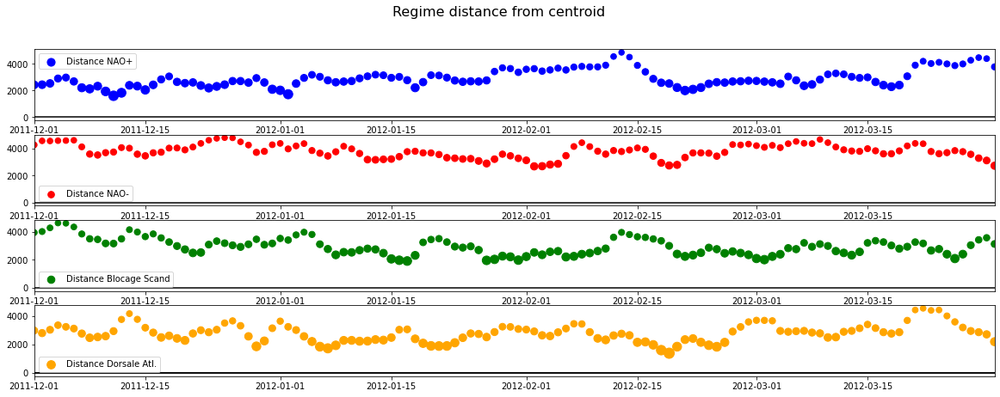

In [66]:
import scipy.spatial.distance as sdist
dist=sdist.cdist(pcs, centroids)
dist_c1=dist[:,0]
dist_c2=dist[:,1]
dist_c3=dist[:,2]
dist_c4=dist[:,3]

def plot_dist(ax):
    #plt.ylim(0, 5)
    plt.axhline(0, color='k')
    plt.xlim(xmin=datetime.datetime(int(str(time[0])[0:4]), int(str(time[0])[5:7]),
                                    int(str(time[0])[8:10])),
             xmax=datetime.datetime(int(str(time[-1])[0:4]), int(str(time[-1])[5:7]),
                                    int(str(time[-1])[8:10])))
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)
    #ax.spines['left'].set_visible(False)
    #ax.axes.get_yaxis().set_visible(False)
    return ax

d1=dist_c1[idx_date1:idx_date2] # distance au régime 1
d2=dist_c2[idx_date1:idx_date2] # distance au régime 2
d3=dist_c3[idx_date1:idx_date2] # distance au régime 3
d4=dist_c4[idx_date1:idx_date2] # distance au régime 4

fig=plt.figure(figsize=(20, 7))
fig.suptitle('Regime distance from centroid', fontsize=16)

ax = fig.add_subplot(4, 1, 1)
plot_dist(ax)
plt.scatter(time, d1, color='blue', s=200000/d1, label='Distance '+regime[0])
plt.legend()

ax = fig.add_subplot(4, 1, 2)
plot_dist(ax)
plt.scatter(time, d2, color='red', s=200000/d2, label='Distance '+regime[1])
plt.legend()

ax = fig.add_subplot(4, 1, 3)
plot_dist(ax)
plt.scatter(time, d3, color='green', s=200000/d3, label='Distance '+regime[2])
plt.legend()

ax = fig.add_subplot(4, 1, 4)
plot_dist(ax)
plt.scatter(time, d4, color='orange', s=200000/d4, label='Distance '+regime[3])
plt.axhline(0, color='k')
plt.legend()

plt.show()

fig.savefig(dir_figs+varname+'_'+domain_name+'_'+season_name+
            '_regimes-distances_'+date_str_title[0]+'-'+date_str_title[-1]+'.png', bbox_inches='tight')

<div class="alert alert-warning">
<b>Tâches supplémentaires : </b>
<p><b>1) </b>Consulter le suivi quotidien des régimes de temps de la DCSC (Météo-France) : http://seasonal.meteo.fr/content/suivi-clim-regimes-quot
</p>
<p><b>2) </b>Consulter les prévisions de régimes de temps ECMWF : https://www.ecmwf.int/en/forecasts/charts/catalogue/extended-regime-probabilities?facets=undefined&time=2021110400&forecast_from=latest
</p>
<p><b>3) </b>Refaire le calepin afin d’extraire les régimes de Z500 sur le Pacifique Nord pour les mois d’hiver. Retrouver les régimes Arctic High, Arctic Low, Pacific Trough et Alaskan Ridge.</p>
<p><b>4) </b>- Refaire le calepin afin d’extraire les régimes de Pmer sur l’Atlantique Nord pour les mois d’été (juin-juillet-août-septembre) (fichier slp_1d_19480101_20191231_NCEP).</p>
</div>

<div class="alert alert-danger">
<b>Défi codage n°1 (*) : séquences record de régimes </b>
<p>
Le tableau cluster contient les numéros de régime pour chaque jour de l'étude (0 = régime 1, 1 = régime 2, 2 = régime 3, 3 = régime 4). Le tableau regime fait la correspondance entre le numéro de régime et le nom du régime. L'index de date dates2 contient les dates de l'étude.

- Exploiter ces 3 tableaux pour établir le top 20 des séquences les plus longues d'un même régime en précisant pour chaque séquence le régime considéré ainsi que la date de de début et de fin de la séquence.

Indication : les fonctions suivantes pourront s'avérer utiles :
- https://docs.python.org/3/library/itertools.html#itertools.groupby
- https://numpy.org/doc/stable/reference/generated/numpy.sort.html
- https://numpy.org/doc/stable/reference/generated/numpy.argsort.html
</p>
</div>

In [67]:
print(cluster)

#with np.printoptions(threshold=np.inf):
#    print(cluster)
    
#for i in range(len(cluster)):
#    print(regime[cluster[i]])

print(dates2)

[2 2 2 ... 1 1 1]
DatetimeIndex(['1957-12-01', '1957-12-02', '1957-12-03', '1957-12-04',
               '1957-12-05', '1957-12-06', '1957-12-07', '1957-12-08',
               '1957-12-09', '1957-12-10',
               ...
               '2018-03-22', '2018-03-23', '2018-03-24', '2018-03-25',
               '2018-03-26', '2018-03-27', '2018-03-28', '2018-03-29',
               '2018-03-30', '2018-03-31'],
              dtype='datetime64[ns]', length=7396, freq=None)


In [68]:
from itertools import groupby
count_dups = [sum(1 for _ in group) for _, group in groupby(cluster)]

#print(count_dups)

print("TOP 20")
for i in range(1,21):
    print("N°"+str(i))
    print("Nombre de jours consécutifs : ", np.sort(count_dups)[-i])
    idmax=sum(count_dups[0:np.argsort(count_dups)[-i]]) # indice du maximum d'occurence
    print("Régime concerné : ", regime[cluster[idmax]])
    print("Date de début de la séquence : ", dates2[idmax])
    print("Date de fin de la séquence : ", dates2[idmax+np.sort(count_dups)[-i]-1])
    print("****************************************************")

TOP 20
N°1
Nombre de jours consécutifs :  46
Régime concerné :  NAO+
Date de début de la séquence :  1990-01-15 00:00:00
Date de fin de la séquence :  1990-03-01 00:00:00
****************************************************
N°2
Nombre de jours consécutifs :  40
Régime concerné :  NAO+
Date de début de la séquence :  1989-02-15 00:00:00
Date de fin de la séquence :  1989-03-26 00:00:00
****************************************************
N°3
Nombre de jours consécutifs :  36
Régime concerné :  NAO+
Date de début de la séquence :  1986-03-14 00:00:00
Date de fin de la séquence :  1986-12-18 00:00:00
****************************************************
N°4
Nombre de jours consécutifs :  34
Régime concerné :  Dorsale Atl.
Date de début de la séquence :  2005-01-18 00:00:00
Date de fin de la séquence :  2005-02-20 00:00:00
****************************************************
N°5
Nombre de jours consécutifs :  33
Régime concerné :  NAO+
Date de début de la séquence :  1997-02-03 00:00:00
Dat

<div class="alert alert-danger">
<b>Défi codage N°2 (**) : non prise en compte des régimes non persistants : </b>
<p>
Le tableau cluster contient les numéros de régime pour chaque jour de l'étude (0 = régime 1, 1 = régime 2, 2 = régime 3, 3 = régime 4).

- Exploiter ce tableau pour déclassifier les séquences de moins de 3 jours consécutifs d'un même régime en les attribuant à un nouveau numéro de régime (4 = classe régime "poubelle"). Ces séqeunces correspondent en effet à des phases de transitions entre 2 régimes.

Indication : la fonction suivante pourra s'avérer utile :
- https://docs.python.org/3/library/itertools.html#itertools.groupby
</p>
</div>

In [69]:
groups = [(k, sum(1 for _ in g)) for k, g in groupby(cluster)]

def threshold(a, value, threshold):
    isvalue = np.concatenate(([0], np.equal(a, value).view(np.int8), [0]))
    #print(isvalue)
    absdiff = np.abs(np.diff(isvalue))
    #print(absdiff)
    ranges = np.where(absdiff == 1)[0].reshape(-1, 2)
    #print(ranges)
    m = (np.diff(ranges, 1) >= threshold).ravel()
    #print(m)
    return ranges[m]

min_duration=3

filter0=threshold(cluster, 0, min_duration)
filter1=threshold(cluster, 1, min_duration)
filter2=threshold(cluster, 2, min_duration)
filter3=threshold(cluster, 3, min_duration)

cluster2=np.ones(len(cluster)).astype(int)*4

for i in range(len(filter0)):
    cluster2[filter0[i][0]:filter0[i][1]]=cluster[filter0[i][0]:filter0[i][1]]

for i in range(len(filter1)):
    cluster2[filter1[i][0]:filter1[i][1]]=cluster[filter1[i][0]:filter1[i][1]]
    
for i in range(len(filter2)):
    cluster2[filter2[i][0]:filter2[i][1]]=cluster[filter2[i][0]:filter2[i][1]]

for i in range(len(filter3)):
    cluster2[filter3[i][0]:filter3[i][1]]=cluster[filter3[i][0]:filter3[i][1]]
    
print(cluster2)

print("Nombre de jours avec régime non-persistant : ", list(cluster2).count(4))
print("% de jours avec régime non-persistant : ", list(cluster2).count(4)/len(cluster)*100)

[2 2 2 ... 1 1 1]
Nombre de jours avec régime non-persistant :  632
% de jours avec régime non-persistant :  8.545159545700379


<div class="alert alert-danger">
<b>Défi codage N°3 (**) : non prise en compte des régimes non robustes : </b>
<p>
Le tableau cluster contient les numéros de régime pour chaque jour de l'étude (0 = régime 1, 1 = régime 2, 2 = régime 3, 3 = régime 4). Les dataArray mean_c1_anom, mean_c2_anom, mean_c3_anom, mean_c3_anom correspondent aux composites des régimes 1 à 4. Le dataArray data_anom[varname][:,:,:]/var_div contient les champs d'anomalies sur toute la période d'étude.

- Exploiter ces données pour déclassifier les régimes dont la corrélation spatiale avec le composite est inférieure à 0.25 en les attribuant à un régime 4 (classe régime "poubelle"). Ces séquences correspondent en effet à des régimes non robustes.

Indication : les fonctions suivantes pourront s'avérer utiles :
- https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html
- https://numpy.org/doc/stable/reference/generated/numpy.ndarray.flatten.html (pour aplatir les tableaux 2D)
</p>
</div>

In [70]:
cor=np.zeros(len(cluster))

for i in range(len(cluster)):
    reg=cluster[i] # régime
    if reg==0:
        centroid0  = mean_c1_anom
    if reg==1:
        centroid0  = mean_c2_anom
    if reg==2:
        centroid0  = mean_c3_anom
    if reg==3:
        centroid0  = mean_c4_anom
        
    centroid=np.array(centroid0).flatten()
    daymap0=data_anom[varname][i,:,:]/var_div
    daymap=np.array(daymap0).flatten()

    cor0=np.corrcoef(daymap, centroid)
    cor[i]=cor0[1,0]

In [71]:
print("Spatial correlation :")
print(cor)
below025=np.all([cor<0.25], axis=0)
print(below025)
cluster2[below025]=4
print("Nombre de jours avec régime non-persistant ou non robuste : ", list(cluster2).count(4))
print("% de jours avec régime non-persistant ou non robuste : ", list(cluster2).count(4)/len(cluster)*100)

Spatial correlation :
[0.43997942 0.50233149 0.556237   ... 0.45101636 0.47894724 0.44468958]
[False False False ... False False False]
Nombre de jours avec régime non-persistant ou non robuste :  1221
% de jours avec régime non-persistant ou non robuste :  16.508923742563546


In [72]:
with np.printoptions(threshold=np.inf):
    print(cluster2)

[2 2 2 2 2 4 3 3 4 4 4 3 3 3 3 0 0 0 0 0 0 3 3 3 3 4 3 3 3 3 3 4 4 4 0 0 0
 0 4 4 4 3 3 3 4 3 3 3 3 1 1 1 1 1 1 1 1 1 2 2 2 2 4 1 1 1 1 1 1 1 1 1 1 1
 4 4 4 1 1 1 1 3 4 4 4 4 4 4 4 4 4 4 4 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 2 2 4 4 3 3 3 3 3 1 1 1 4 0 0 0 1 1 1 1 1 1 1 1 2 2 2 2 2
 0 0 0 0 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 4 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2 3 3 3 4 4 0 0 0 0 0 0 0 0 0 0 0 4 4 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 4 0 0 0 0 0 0 0 0 0 0 0 4 4 4 4 4 4 2 4 4 4 0 0
 0 0 0 0 0 0 4 1 1 1 4 0 0 0 0 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 4 0
 0 0 4 1 1 1 1 1 4 4 4 4 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 4 4 2 2 2 2 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0
 0 4 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 0 0 0 0 0 4 4 4 4 4 3 3 4 4 4 3 3 2 2
 2 2 2 2 2 2 2 2 2 2 4 4 4 4 0 0 0 0 0 4 1 1 1 4 0 0 0 0 0 0 4 2 2 2 2 2 2
 2 2 2 2 2 2 2 0 0 0 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 4 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 1 1 1 1 1 1 1 1 

# Composites des régimes avec prise en compte du régime poubelle

In [73]:
nc1=list(cluster2[:]).count(0)
nc2=list(cluster2[:]).count(1)
nc3=list(cluster2[:]).count(2)
nc4=list(cluster2[:]).count(3)

f1=int(nc1/cluster2.shape[0]*100)
f2=int(nc2/cluster2.shape[0]*100)
f3=int(nc3/cluster2.shape[0]*100)
f4=int(nc4/cluster2.shape[0]*100)

In [74]:
id_cluster1=np.any([cluster2==0],axis=0)
id_cluster2=np.any([cluster2==1],axis=0)
id_cluster3=np.any([cluster2==2],axis=0)
id_cluster4=np.any([cluster2==3],axis=0)

print(id_cluster1)
print(id_cluster2)
print(id_cluster3)
print(id_cluster4)

mean_c1 = var[id_cluster1,:,:].mean(axis=0)/var_div
mean_c2 = var[id_cluster2,:,:].mean(axis=0)/var_div
mean_c3 = var[id_cluster3,:,:].mean(axis=0)/var_div
mean_c4 = var[id_cluster4,:,:].mean(axis=0)/var_div

mean_c1_anom = var_anom[id_cluster1,:,:].mean(axis=0)/var_div
mean_c2_anom = var_anom[id_cluster2,:,:].mean(axis=0)/var_div
mean_c3_anom = var_anom[id_cluster3,:,:].mean(axis=0)/var_div
mean_c4_anom = var_anom[id_cluster4,:,:].mean(axis=0)/var_div

[False False False ... False False False]
[False False False ...  True  True  True]
[ True  True  True ... False False False]
[False False False ... False False False]


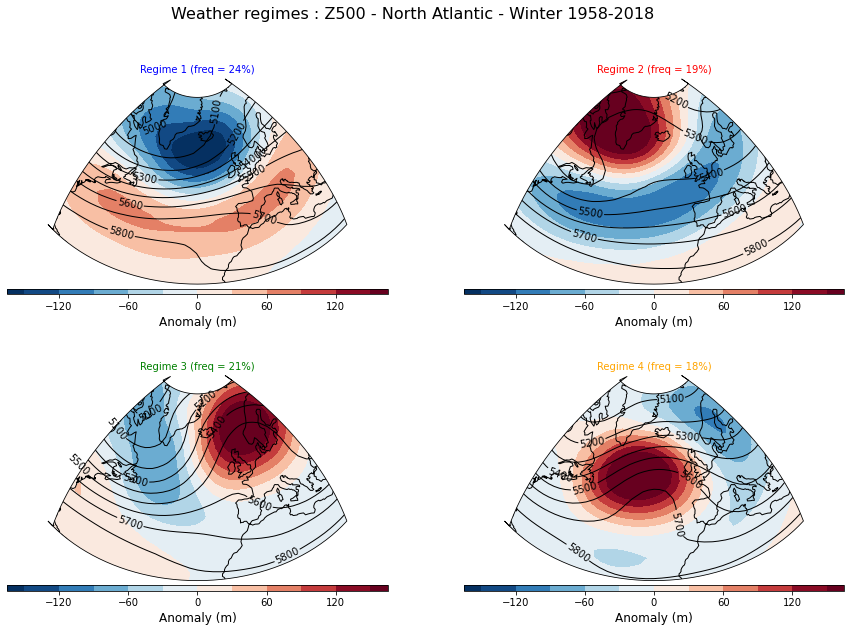

In [75]:
if varname=='zg500':
    clevs = np.linspace(5000, 6000, 11)
    clevs_anom = np.linspace(-150, 150, 11)
if varname=='slp':
    clevs = np.linspace(990, 1020, 15)
    clevs_anom = np.linspace(-8, 8, 17)

fig = plt.figure(figsize=(15, 10))
fig.suptitle('Weather regimes : '+var_text+' - '+domain+' - '+season+ ' '+season1+'-'+season2, fontsize=16)

ax = fig.add_subplot(2, 2, 1, projection=projection)
plt.title('Regime 1 (freq = '+str(f1)+'%)', fontsize=10, loc='center', color=couleur[0])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c1_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c1, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

ax = fig.add_subplot(2, 2, 2, projection=projection)
plt.title('Regime 2 (freq = '+str(f2)+'%)', fontsize=10, loc='center', color=couleur[1])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c2_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c2, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

ax = fig.add_subplot(2, 2, 3, projection=projection)
plt.title('Regime 3 (freq = '+str(f3)+'%)', fontsize=10, loc='center', color=couleur[2])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c3_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c3, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

ax = fig.add_subplot(2, 2, 4, projection=projection)
plt.title('Regime 4 (freq = '+str(f4)+'%)', fontsize=10, loc='center', color=couleur[3])
ax.coastlines()
ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
cf = ax.contourf(lons, lats, mean_c4_anom, levels=clevs_anom, 
                 cmap=cmap2, extend='both', transform=ccrs.PlateCarree())
c = ax.contour(lons, lats, mean_c4, levels=clevs, colors='black', linewidths=1, transform=ccrs.PlateCarree())
ax.clabel(c, inline=1, fmt='%4.0f', fontsize=10)
cb = fig.colorbar(cf, orientation='horizontal', aspect=65, shrink=1, pad=0.05, extendrect='True')
cb.set_label('Anomaly ('+units+')', fontsize=12)

plt.show()

figname=dir_figs+varname+'_'+domain_name+'_'+season_name+'_'+'regimes2'
fig.savefig(figname+'.png', bbox_inches='tight')

# <span style='background :yellow' > Cartes avec régimes non persistants et non-robustes </span>

In [76]:
regime2=[r1,r2,r3,r4,"No regime"]
colors2=[""]*len(cluster2)
couleur2=["blue","red","green","orange","grey"]
for i in range(len(cluster2)):
 colors2[i]=couleur2[cluster2[i]]

In [77]:
if season_name == 'winter':
    choix=input('hiver ? ')
    leap_year=calendar.isleap(int(choix)+1)
    date1=choix+'-12-01'
    idx_date1=dates2.get_loc(date1, method ='ffill')
    if leap_year:
        print('Année bisextile')
        idx_date2=idx_date1+122
    else:
        idx_date2=idx_date1+121
    
if season_name == 'summer':
    choix=input('été ? ')
    date1=choix+'-06-01'
    idx_date2=idx_date1+121

hiver ? 2011
Année bisextile


In [78]:
time=dates2[idx_date1:idx_date2]
print(time.shape)

date1=str(time[0])[0:10]
date2=str(time[-1])[0:10]
print(date1)
print(date2)

time_str = [x for x in range(len(time))]
date_str = [x for x in range(len(time))]
date_str_title = [x for x in range(len(time))]

for i in range(len(time)):
    time_str[i] = str(time[i])
    date_str_title[i] = time_str[i][0:10]	
    date_str[i] = time_str[i][5:10]
    
leap_year=calendar.isleap(int(time_str[-1][0:4]))
if leap_year:
    print('Année bisextile')

(122,)
2011-12-01
2012-03-31
Année bisextile


In [79]:
data_month_anom    = data_anom.sel(time=slice(date1,date2))
z_anom=data_month_anom[varname]/var_div

time  = data_month_anom.time.values
lat  = data_month_anom.lat.values
lon  = data_month_anom.lon.values

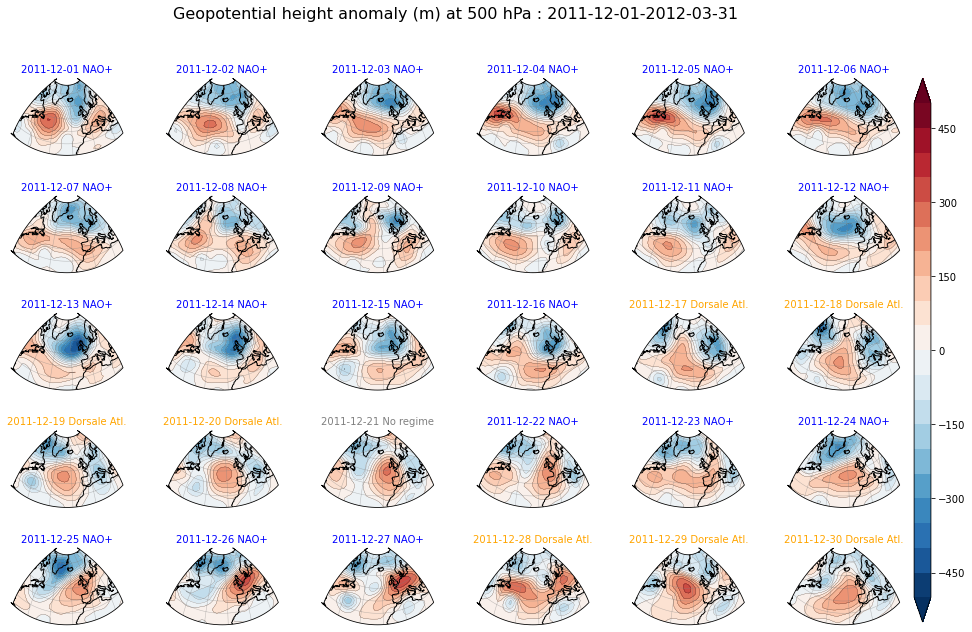

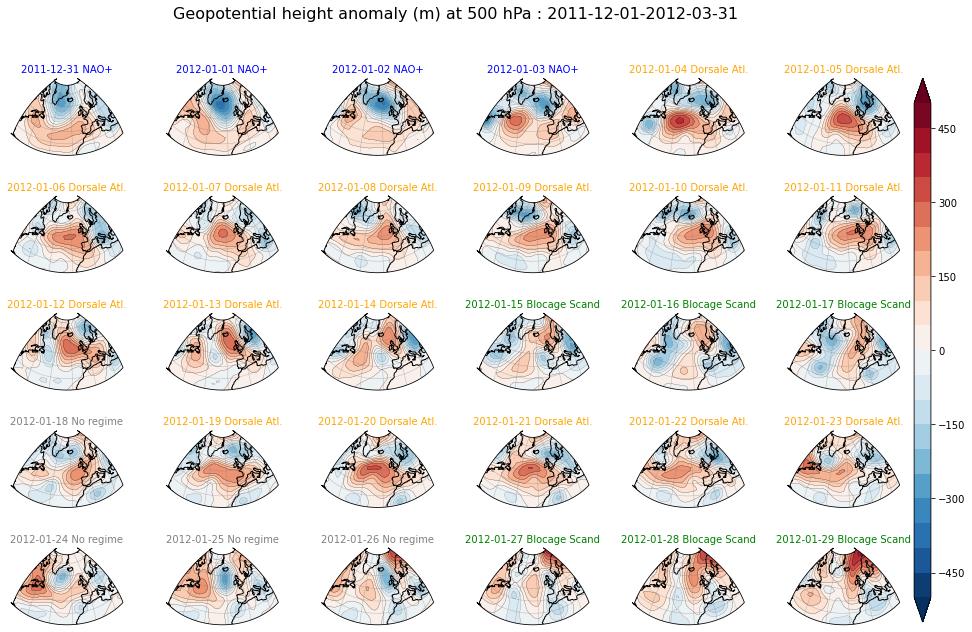

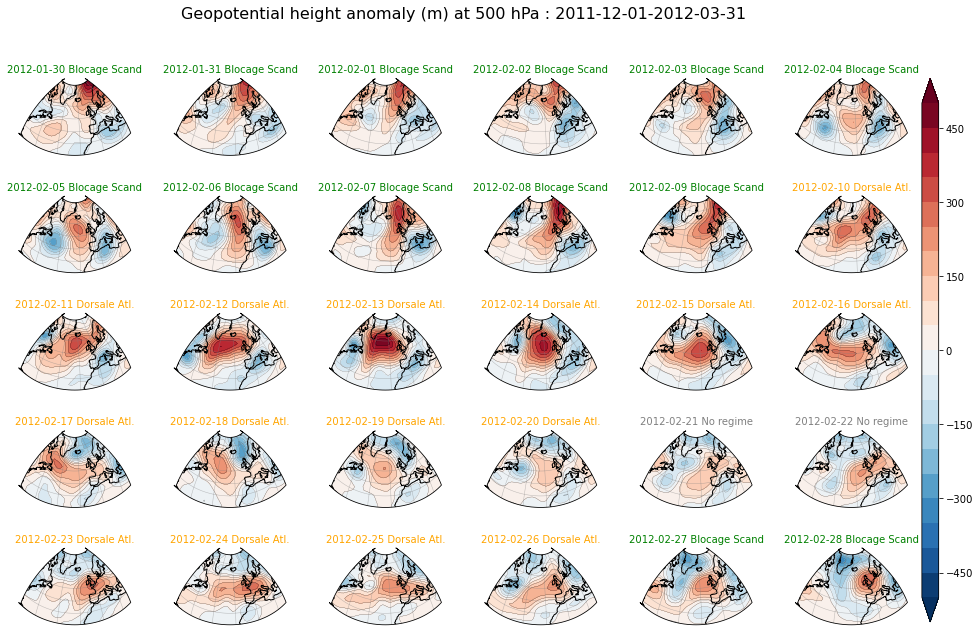

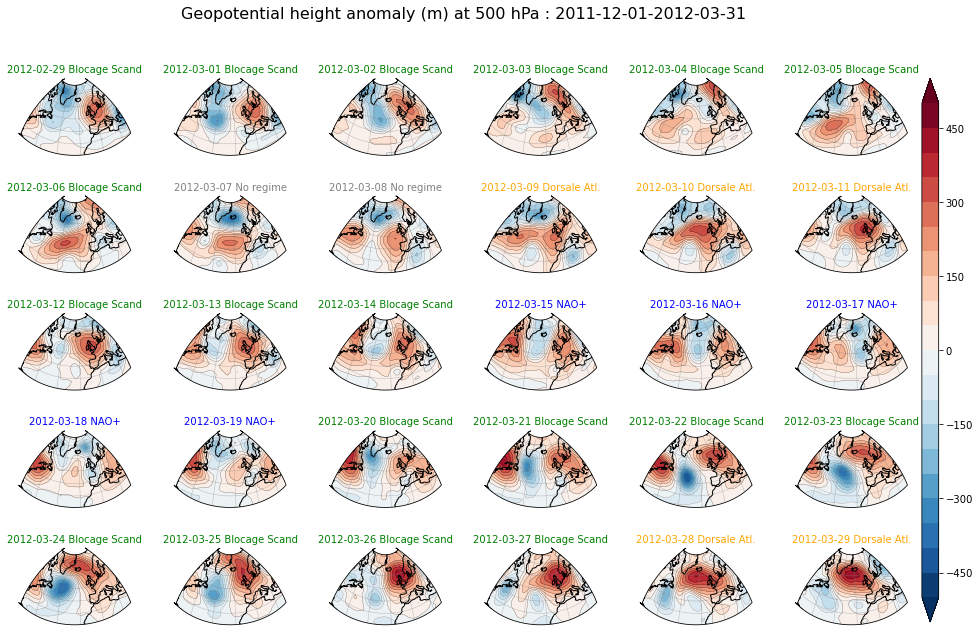

In [80]:
if varname=='zg500':
    plt_title2 = 'Geopotential height anomaly ('+units+') at 500 hPa : '+ str(date1)+'-'+str(date2)

if varname=='slp':
    plt_title2 = 'Mean Sea Level Pressure anomaly ('+units+') : '+ str(date1)+'-'+str(date2)

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode
                   
for i, ax in enumerate(axgr):
    reg=cluster2[idx_date1+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i]+' '+regime2[reg], fontsize=10, color=colors2[idx_date1+i])
    p1 = ax.contourf(lon, lat, z_anom[i,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster2_'+str(date1)+'-'+str(date2)+'_1'
fig.savefig(figname+'.png', bbox_inches='tight')

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    reg=cluster2[idx_date1+30+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i+30]+' '+regime2[reg], fontsize=10, color=colors2[idx_date1+i+30])
    p1 = ax.contourf(lon, lat, z_anom[i+30,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i+30,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster2_'+str(date1)+'-'+str(date2)+'_2'
fig.savefig(figname+'.png', bbox_inches='tight')

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    reg=cluster2[idx_date1+60+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i+60]+' '+regime2[reg], fontsize=10, color=colors2[idx_date1+i+60])
    p1 = ax.contourf(lon, lat, z_anom[i+60,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i+60,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster2_'+str(date1)+'-'+str(date2)+'_3'
fig.savefig(figname+'.png', bbox_inches='tight')

#
axes_class = (GeoAxes, dict(map_projection=projection))
fig = plt.figure(figsize=(17,10))
fig.suptitle(plt_title2, fontsize=16)

axgr = AxesGrid(fig, 111, axes_class=axes_class,
       nrows_ncols=(5, 6),
       axes_pad=0.6,
       cbar_location='right',
       cbar_mode='single', # None/single/each
       cbar_pad=0.2,
       cbar_size='3%',
       label_mode='')  # note the empty label_mode

for i, ax in enumerate(axgr):
    reg=cluster2[idx_date1+90+i] # régime
    ax.coastlines()
    ax.set_extent([lonW, lonE, latS, latN], crs=ccrs.PlateCarree())
    boundary_path = make_boundary_path(lon, lat)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
    ax.gridlines(crs=ccrs.PlateCarree(), linewidth=0.5, color='gray', alpha=0.5, linestyle='-')
    ax.set_title(date_str_title[i+90]+' '+regime2[reg], fontsize=10, color=colors2[idx_date1+i+90])
    p1 = ax.contourf(lon, lat, z_anom[i+90,:,:], levels2, transform=ccrs.PlateCarree(), cmap=cmap2, extend='both')
    p2 = ax.contour(lon, lat, z_anom[i+90,:,:], levels2, colors='black', linewidths=0.2, transform=ccrs.PlateCarree())
    axgr.cbar_axes[i].colorbar(p1)

plt.show()

figname=dir_figs+varname+'_anom_'+domain_name+'_'+season_name+'_cluster2_'+str(date1)+'-'+str(date2)+'_4'
fig.savefig(figname+'.png', bbox_inches='tight')